In [2]:
## helpful packages
import pandas as pd
import numpy as np
import random
import re
import string
import requests
import plotnine 
from plotnine import *
import matplotlib.pyplot as plt
import yaml
#import warnings
#warnings.filterwarnings("ignore")

## sklearn imports
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

## print mult things
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [3]:
dtype_spec = {2:str, 3:str, 6:str, 7:str, 10:str, 11:str, 12:str, 13:str, 14:str, 15:str, 16:str, 17:str, 20:str}
entities_df = pd.read_csv("nodes-entities.csv", dtype=dtype_spec)

In [4]:
entities_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 814344 entries, 0 to 814343
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   node_id                   814344 non-null  int64  
 1   name                      814315 non-null  object 
 2   original_name             389522 non-null  object 
 3   former_name               6837 non-null    object 
 4   jurisdiction              806780 non-null  object 
 5   jurisdiction_description  806782 non-null  object 
 6   company_type              138751 non-null  object 
 7   address                   299323 non-null  object 
 8   internal_id               389522 non-null  float64
 9   incorporation_date        788470 non-null  object 
 10  inactivation_date         144773 non-null  object 
 11  struck_off_date           343843 non-null  object 
 12  dorm_date                 20207 non-null   object 
 13  status                    358036 non-null  o

In [24]:
entities_df.jurisdiction_description.unique()

array(['Samoa', 'Panama', 'Nevada', 'United Kingdom', 'Singapore',
       'Ras Al Khaimah', 'Isle Of Man', 'Bahamas', 'British Anguilla',
       'Seychelles', 'Niue', 'Uruguay', 'British Virgin Islands',
       'Hong Kong', 'New Zealand', 'Cyprus', 'Malta', 'Belize', 'Jersey',
       'Wyoming', 'Costa Rica', 'Undetermined', 'Cayman',
       'Recorded in leaked files as "fund"', 'Labuan', 'Marshall Islands',
       'Mauritius', 'St. Lucia', 'Malaysia', 'Dubai', 'Vanuatu',
       'Cook Islands', 'Bermuda', 'Brunei', 'Liberia',
       'United States Of America', 'China', 'Thailand', 'Netherlands',
       'Ireland', 'Aruba', 'United Arab Emirates', 'Antigua and Barbuda',
       'Anguilla', 'Netherlands Antilles', 'Barbados', 'Lebanon',
       'Cayman Islands', 'Ghana', 'Grenada', 'Guernsey', 'Gibraltar',
       'Isle of Man', 'Saint Kitts and Nevis', 'Liechtenstein',
       'Luxembourg', 'Turks and Caicos Islands',
       'United States of America', 'State of Delaware',
       'Saint Vince

In [25]:
# 1. Normalize status column
entities_df['status_normalized'] = entities_df['status'].str.lower().str.strip()

# 2. Create a boolean column to identify active/open status
entities_df['is_active'] = entities_df['status_normalized'].str.contains('active', na=False) | entities_df['status_normalized'].str.contains('open', na=False)

# 3. Parse date columns to datetime (if not already done)
entities_df['incorporation_date'] = pd.to_datetime(entities_df['incorporation_date'], errors='coerce')
entities_df['inactivation_date'] = pd.to_datetime(entities_df['inactivation_date'], errors='coerce')
entities_df['struck_off_date'] = pd.to_datetime(entities_df['struck_off_date'], errors='coerce')

# 4. Create a unified 'end_date' that prioritizes 'inactivation_date' over 'struck_off_date'
entities_df['end_date'] = entities_df['inactivation_date'].combine_first(entities_df['struck_off_date'])

# 5. Build boolean mask for entities with proper date metadata
has_valid_incorp = entities_df['incorporation_date'].notna()
has_valid_end_date = entities_df['end_date'].notna()

# 6. Filter condition:
# Keep entity if it has incorporation date AND
# (has inactivation/struck_off date OR is active/open)
valid_entities_mask = has_valid_incorp & (has_valid_end_date | entities_df['is_active'])

# 7. Filter dataframe
entities_df_filtered = entities_df[valid_entities_mask].copy()

print(f"Filtered entities count: {entities_df_filtered.shape[0]}")

Filtered entities count: 456945


In [26]:
def normalize_jurisdiction(name):
    if pd.isna(name):
        return ''
    # Lowercase
    name = name.lower()
    
    # Strip whitespace and newlines
    name = name.strip().replace('\n', '')
    
    # Replace 'british anguilla' with 'anguilla'
    if 'british anguilla' in name:
        name = name.replace('british anguilla', 'anguilla')
    
    # Replace 'st.' with 'saint'
    name = name.replace('st.', 'saint')
    # Also replace 'st ' with 'saint ' to catch "St Kitts" without dot
    name = name.replace('st ', 'saint ')
    
    # Replace & with and
    name = name.replace('&', 'and')
    
    # Replace multiple spaces with single space, then strip again
    name = ' '.join(name.split())
    
    # Replace 'u.s.' with 'us'
    name = name.replace('u.s.', 'us')
    
    # Fix specific misspellings / variants
    # Cook Islands might appear as 'cookislands', so fix it:
    if 'cookislands' in name:
        name = name.replace('cookislands', 'cook islands')

    # Normalize nevis alone to full name if possible
    if name == 'nevis':
        name = 'saint kitts and nevis'
    
    return name

# Normalize jurisdiction_description in your dataframe
entities_df_filtered['jurisdiction_norm'] = entities_df_filtered['jurisdiction_description'].apply(normalize_jurisdiction)

# Example: Normalize your OECD blacklist entries with same function
oecd_2000_blacklist_raw = [
    'Andorra', 'Anguilla', 'Antigua and Barbuda', 'Aruba', 'Bahamas', 'Bahrain',
    'Barbados', 'Belize', 'British Virgin Islands', 'Cook Islands', 'Dominica',
    'Gibraltar', 'Grenada', 'Guernsey', 'Isle of Man', 'Jersey', 'Liberia',
    'Liechtenstein', 'Maldives', 'Marshall Islands', 'Monaco', 'Montserrat',
    'Nauru', 'Netherlands Antilles', 'Niue', 'Panama', 'Samoa', 'Seychelles',
    'St. Lucia', 'St. Kitts and Nevis', 'St. Vincent and the Grenadines', 'Tonga',
    'Turks and Caicos Islands', 'U.S. Virgin Islands', 'Vanuatu'
]

oecd_2000_blacklist = [normalize_jurisdiction(c) for c in oecd_2000_blacklist_raw]

# Now you can filter using the normalized column and normalized blacklist:
blacklist_entities_df = entities_df_filtered[entities_df_filtered['jurisdiction_norm'].isin(oecd_2000_blacklist)].copy()

print(f"Number of entities in blacklisted jurisdictions with proper date data: {blacklist_entities_df.shape[0]}")

Number of entities in blacklisted jurisdictions with proper date data: 435835


<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Entities in OECD 2000 Blacklist Jurisdictions: Incorporation & Inactivation by Year')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Number of Entities')

(1980.0, 2020.0)

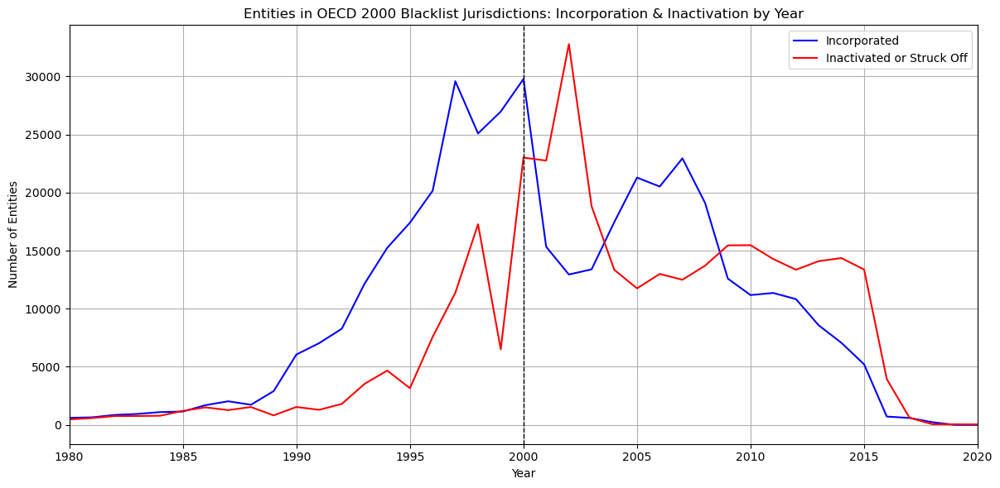

In [27]:
## time series line graph

# Assume your entities_df has these columns, normalized and ready:
# 'incorporation_date', 'inactivation_date', 'struck_off_date', 'jurisdiction_norm'



# get years
blacklist_entities_df['incorp_year'] = blacklist_entities_df['incorporation_date'].dt.year


# Choose earliest date between inactivation and struck_off for "end" events
blacklist_entities_df['end_date'] = blacklist_entities_df[['inactivation_date', 'struck_off_date']].min(axis=1)
blacklist_entities_df['end_year'] = blacklist_entities_df['end_date'].dt.year

# Group by year and count unique entities incorporated by year
incorp_counts = blacklist_entities_df.groupby('incorp_year')['node_id'].nunique().sort_index()

# Group by year and count unique entities ended by year
end_counts = blacklist_entities_df.groupby('end_year')['node_id'].nunique().sort_index()

# Plotting
plt.figure(figsize=(12, 6))

plt.plot(incorp_counts.index, incorp_counts.values, label='Incorporated', color='blue')
plt.plot(end_counts.index, end_counts.values, label='Inactivated or Struck Off', color='red')

# Vertical dotted black line at year 2000
plt.axvline(x=2000, color='black', linestyle='--', linewidth=1)

plt.title('Entities in OECD 2000 Blacklist Jurisdictions: Incorporation & Inactivation by Year')
plt.xlabel('Year')
plt.ylabel('Number of Entities')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.xlim(1980, 2020)
plt.show()

<Axes: ylabel='jurisdiction_norm'>

Text(0.5, 1.0, 'Top 10 Jurisdictions of Incorporation Before 2000')

Text(0.5, 0, 'Number of Entities')

Text(0, 0.5, 'Jurisdiction')

<Axes: ylabel='jurisdiction_norm'>

Text(0.5, 1.0, 'Top 10 Jurisdictions of Incorporation After 2007')

Text(0.5, 0, 'Number of Entities')

Text(0, 0.5, '')

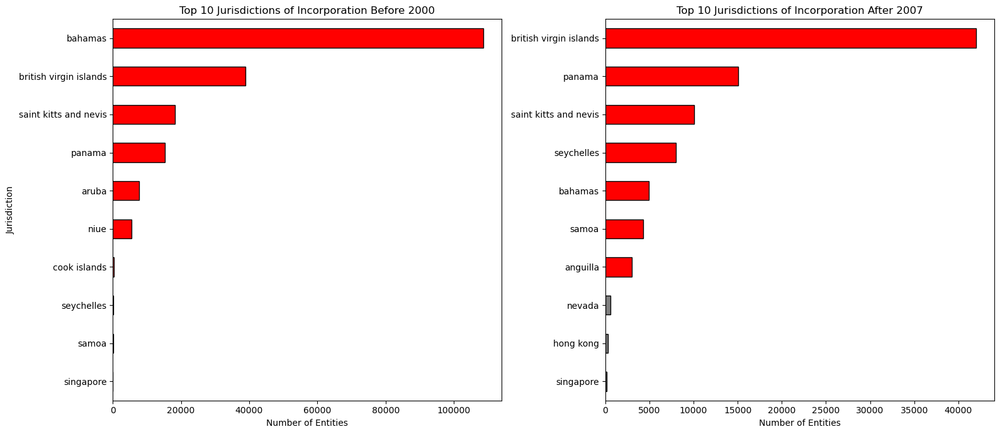

In [28]:
pre_cutoff = 2000
post_cutoff = 2007

# Extract incorporation year once
entities_df_filtered['incorp_year'] = entities_df_filtered['incorporation_date'].dt.year

# Filter pre-2000 and post-2007 entities
pre_2000 = entities_df_filtered[entities_df_filtered['incorp_year'] < pre_cutoff]
post_2007 = entities_df_filtered[entities_df_filtered['incorp_year'] > post_cutoff]

# Exclude 'undetermined' before taking top 10
pre_counts = (
    pre_2000[pre_2000['jurisdiction_norm'] != 'undetermined']
    .groupby('jurisdiction_norm')['node_id']
    .nunique()
    .sort_values(ascending=False)
    .head(10)
)

post_counts = (
    post_2007[post_2007['jurisdiction_norm'] != 'undetermined']
    .groupby('jurisdiction_norm')['node_id']
    .nunique()
    .sort_values(ascending=False)
    .head(10)
)

# Prepare colors: highlight bars for jurisdictions on the OECD blacklist
blacklist_set = set(oecd_2000_blacklist)  # your normalized blacklist list

def color_map(jurisdictions, blacklist, highlight_color='red', default_color='gray'):
    return [highlight_color if j in blacklist else default_color for j in jurisdictions]

pre_colors = color_map(pre_counts.index, blacklist_set)
post_colors = color_map(post_counts.index, blacklist_set)

# Plot side by side horizontal bar charts
fig, axes = plt.subplots(1, 2, figsize=(16, 7), sharey=False)

pre_counts.plot(
    kind='barh',
    ax=axes[0],
    color=pre_colors,
    edgecolor='black'
)
axes[0].invert_yaxis()
axes[0].set_title('Top 10 Jurisdictions of Incorporation Before 2000')
axes[0].set_xlabel('Number of Entities')
axes[0].set_ylabel('Jurisdiction')

post_counts.plot(
    kind='barh',
    ax=axes[1],
    color=post_colors,
    edgecolor='black'
)
axes[1].invert_yaxis()
axes[1].set_title('Top 10 Jurisdictions of Incorporation After 2007')
axes[1].set_xlabel('Number of Entities')
axes[1].set_ylabel('')

plt.tight_layout()
plt.show()

<Axes: ylabel='jurisdiction_norm'>

Text(0.5, 1.0, 'Top 10 Jurisdictions of Incorporation Before 2000')

Text(0.5, 0, 'Number of Entities')

Text(0, 0.5, 'Jurisdiction')

<Axes: ylabel='jurisdiction_norm'>

Text(0.5, 1.0, 'Top 10 Jurisdictions of Incorporation After 2007')

Text(0.5, 0, 'Number of Entities')

Text(0, 0.5, '')

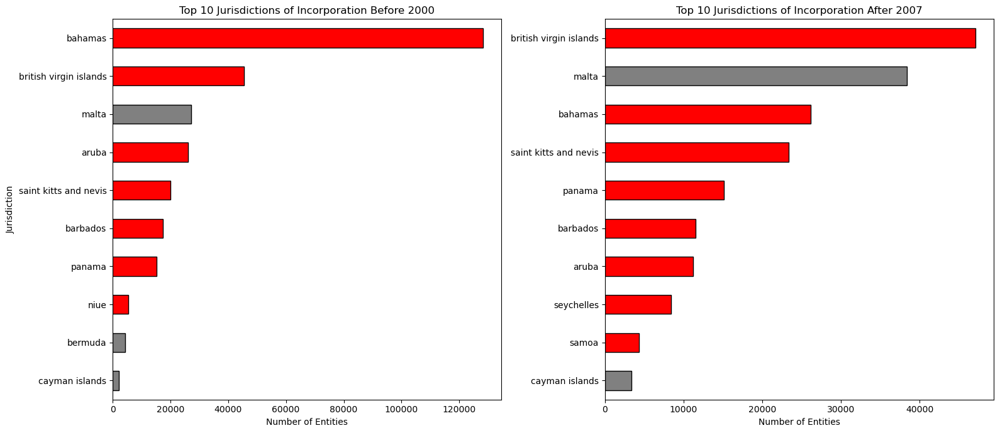

In [29]:

# Filter entities_df to keep rows where incorporation_date is present
entities_df['incorporation_date'] = pd.to_datetime(entities_df['incorporation_date'], errors='coerce')
entities_with_incorp = entities_df[entities_df['incorporation_date'].notna()].copy()

# Normalize jurisdiction_description as before
def normalize_jurisdiction(name):
    if pd.isna(name):
        return ''
    name = name.lower()
    name = name.strip().replace('\n', '')
    if 'british anguilla' in name:
        name = name.replace('british anguilla', 'anguilla')
    name = name.replace('st.', 'saint')
    name = name.replace('st ', 'saint ')
    name = name.replace('&', 'and')
    name = ' '.join(name.split())
    name = name.replace('u.s.', 'us')
    if 'cookislands' in name:
        name = name.replace('cookislands', 'cook islands')
    if name == 'nevis':
        name = 'saint kitts and nevis'
    return name

entities_with_incorp['jurisdiction_norm'] = entities_with_incorp['jurisdiction_description'].apply(normalize_jurisdiction)

# Define cutoff years for periods
pre_cutoff = 2000
post_cutoff = 2007

# Create incorporation year column
entities_with_incorp['incorp_year'] = entities_with_incorp['incorporation_date'].dt.year

# Filter for pre-2000 and post-2007 periods
pre_2000 = entities_with_incorp[entities_with_incorp['incorp_year'] < pre_cutoff]
post_2007 = entities_with_incorp[entities_with_incorp['incorp_year'] > post_cutoff]

# Remove 'undetermined' jurisdictions before computing top 10
pre_counts = (
    pre_2000[pre_2000['jurisdiction_norm'] != 'undetermined']
    .groupby('jurisdiction_norm')['node_id']
    .nunique()
    .sort_values(ascending=False)
    .head(10)
)

post_counts = (
    post_2007[post_2007['jurisdiction_norm'] != 'undetermined']
    .groupby('jurisdiction_norm')['node_id']
    .nunique()
    .sort_values(ascending=False)
    .head(10)
)

# Prepare color maps for bars
blacklist_set = set(oecd_2000_blacklist)

def color_map(jurisdictions, blacklist, highlight_color='red', default_color='gray'):
    return [highlight_color if j in blacklist else default_color for j in jurisdictions]

pre_colors = color_map(pre_counts.index, blacklist_set)
post_colors = color_map(post_counts.index, blacklist_set)

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(16, 7), sharey=False)

pre_counts.plot(
    kind='barh',
    ax=axes[0],
    color=pre_colors,
    edgecolor='black'
)
axes[0].invert_yaxis()
axes[0].set_title('Top 10 Jurisdictions of Incorporation Before 2000')
axes[0].set_xlabel('Number of Entities')
axes[0].set_ylabel('Jurisdiction')

post_counts.plot(
    kind='barh',
    ax=axes[1],
    color=post_colors,
    edgecolor='black'
)
axes[1].invert_yaxis()
axes[1].set_title('Top 10 Jurisdictions of Incorporation After 2007')
axes[1].set_xlabel('Number of Entities')
axes[1].set_ylabel('')

plt.tight_layout()
plt.show()

In [30]:
entities_df.jurisdiction_description.unique()

array(['Samoa', 'Panama', 'Nevada', 'United Kingdom', 'Singapore',
       'Ras Al Khaimah', 'Isle Of Man', 'Bahamas', 'British Anguilla',
       'Seychelles', 'Niue', 'Uruguay', 'British Virgin Islands',
       'Hong Kong', 'New Zealand', 'Cyprus', 'Malta', 'Belize', 'Jersey',
       'Wyoming', 'Costa Rica', 'Undetermined', 'Cayman',
       'Recorded in leaked files as "fund"', 'Labuan', 'Marshall Islands',
       'Mauritius', 'St. Lucia', 'Malaysia', 'Dubai', 'Vanuatu',
       'Cook Islands', 'Bermuda', 'Brunei', 'Liberia',
       'United States Of America', 'China', 'Thailand', 'Netherlands',
       'Ireland', 'Aruba', 'United Arab Emirates', 'Antigua and Barbuda',
       'Anguilla', 'Netherlands Antilles', 'Barbados', 'Lebanon',
       'Cayman Islands', 'Ghana', 'Grenada', 'Guernsey', 'Gibraltar',
       'Isle of Man', 'Saint Kitts and Nevis', 'Liechtenstein',
       'Luxembourg', 'Turks and Caicos Islands',
       'United States of America', 'State of Delaware',
       'Saint Vince

In [31]:
entities_df_filtered.jurisdiction_description.unique()

array(['Samoa', 'Panama', 'Nevada', 'United Kingdom', 'Singapore',
       'Ras Al Khaimah', 'Isle Of Man', 'Bahamas', 'British Anguilla',
       'Seychelles', 'Niue', 'Uruguay', 'British Virgin Islands',
       'Hong Kong', 'New Zealand', 'Cyprus', 'Malta', 'Belize', 'Jersey',
       'Wyoming', 'Costa Rica', 'Undetermined', 'Cayman',
       'Recorded in leaked files as "fund"', 'Labuan', 'Marshall Islands',
       'Mauritius', 'St. Lucia', 'Malaysia', 'Dubai', 'Vanuatu',
       'Cook Islands', 'Bermuda', 'United States Of America', 'China',
       'Netherlands', 'Thailand', 'Aruba', 'Barbados',
       'Saint Kitts and Nevis', 'Panama\n', 'Delaware', 'Cayman Islands',
       'Cyprus '], dtype=object)

In [32]:
merged_df = pd.read_csv('ICIJ_Merged.csv')

/var/folders/5x/0sqjbpy13p3gzjlddpxqjtfw0000gn/T/ipykernel_82459/1195876193.py:1: DtypeWarning: Columns (4,5,6,7,8,10,11,14,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,37,39,40,41,42,43,45,46,47,48,49,50,51,52,53) have mixed types. Specify dtype option on import or set low_memory=False.


In [14]:
merged_df

,node_id_start,node_id_end,rel_type,link,status,start_date,end_date,sourceid,address_start,name_start,...,internal_id_end,incorporation_date_end,inactivation_date_end,struck_off_date_end,dorm_date_end,status_end,service_provider_end,ibcruc_end,type_end,closed_date_end
0,10002580,14106952,registered_address,registered address,NaN,NaN,NaN,Panama Papers,STEMBRIDGE TRUST (IRELAND) LIMITED 5 THE COURT...,FUSION TRADING LIMITED,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10004460,14101133,registered_address,registered address,NaN,NaN,NaN,Panama Papers,MF CORPORATE (UK) LIMITED 520 S. 7TH STREET SU...,MF CORPORATE (UK) LIMITED,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10023813,14105100,registered_address,registered address,NaN,NaN,NaN,Panama Papers,REIG INVESTMENTS LLP INVISION HOUSE WILBURY WA...,REIG INVESTMENTS LLP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10023840,14100712,registered_address,registered address,NaN,NaN,NaN,Panama Papers,MARCUSSI INTERNATIONAL LLP INVISION HOUSE WILB...,MARCUSSI INTERNATIONAL LLP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10010428,14093957,registered_address,registered address,NaN,NaN,NaN,Panama Papers,COLLYER BRISTOW LLP SOLICITORS 4 BEDFORD ROW L...,PULSAR HOLDINGS CORPORATION,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3331085,56074585,55049439,officer_of,judicial representative of,NaN,NaN,NaN,Paradise Papers - Malta corporate registry,NaN,MICELI ANTONIO,...,NaN,2011-11-23,NaN,NaN,NaN,NaN,NaN,C54493,NaN,NaN
3331086,56074586,55071595,officer_of,judicial representative of,NaN,NaN,NaN,Paradise Papers - Malta corporate registry,NaN,SALVATORE TRAVIGLIA,...,NaN,2016-02-19,NaN,NaN,NaN,NaN,NaN,C74433,NaN,NaN
3331087,56074588,55024010,officer_of,legal representative of,NaN,NaN,NaN,Paradise Papers - Malta corporate registry,NaN,PASQUALE SCARAMOZZINO,...,NaN,2003-06-17,NaN,NaN,NaN,NaN,NaN,C31606,NaN,NaN
3331088,56074591,55054121,officer_of,director of,NaN,NaN,NaN,Paradise Papers - Malta corporate registry,NaN,MASSIMO ALOE,...,NaN,2012-12-19,NaN,NaN,NaN,NaN,NaN,C58707,NaN,NaN


--- Officer Registration Analysis ---
Percentage of officers registered in the same jurisdiction as their entity: 32.43%


<Figure size 1000x600 with 0 Axes>

<Axes: ylabel='jurisdiction_norm_end'>

Text(0.5, 1.0, 'Top 10 Jurisdictions: Officers in Same Jurisdiction as Entity')

Text(0.5, 0, 'Number of Unique Officers')

Text(0, 0.5, 'Entity Jurisdiction')

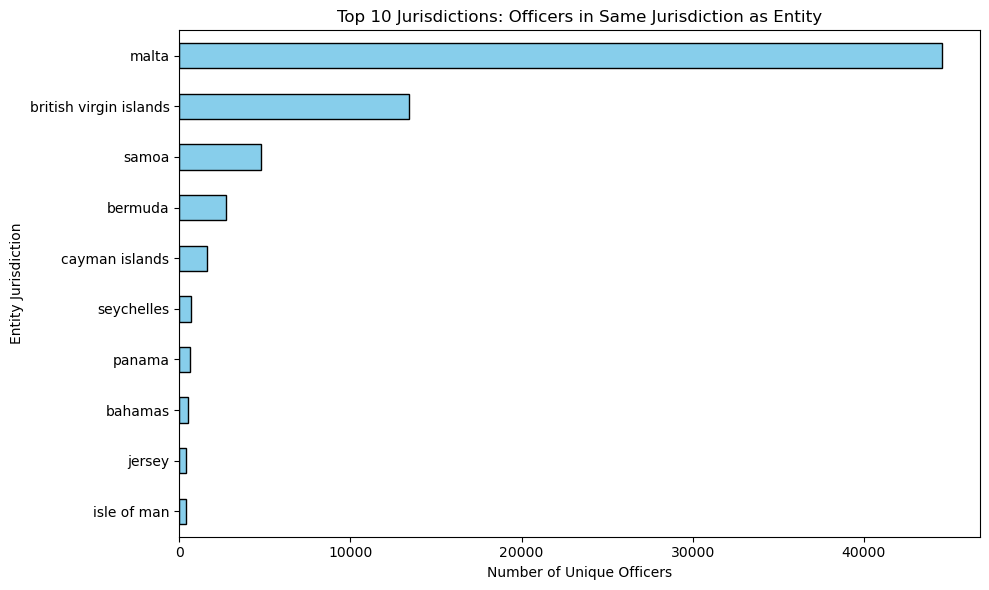


--- OECD 2000 Blacklist Impact on Entity Incorporations & Inactivations (from merged_df) ---


/var/folders/5x/0sqjbpy13p3gzjlddpxqjtfw0000gn/T/ipykernel_82459/1165626125.py:77: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
/var/folders/5x/0sqjbpy13p3gzjlddpxqjtfw0000gn/T/ipykernel_82459/1165626125.py:78: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.


<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Entities in OECD 2000 Blacklist Jurisdictions (from merged_df)')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Number of Entities')

(1980.0, 2025.0)

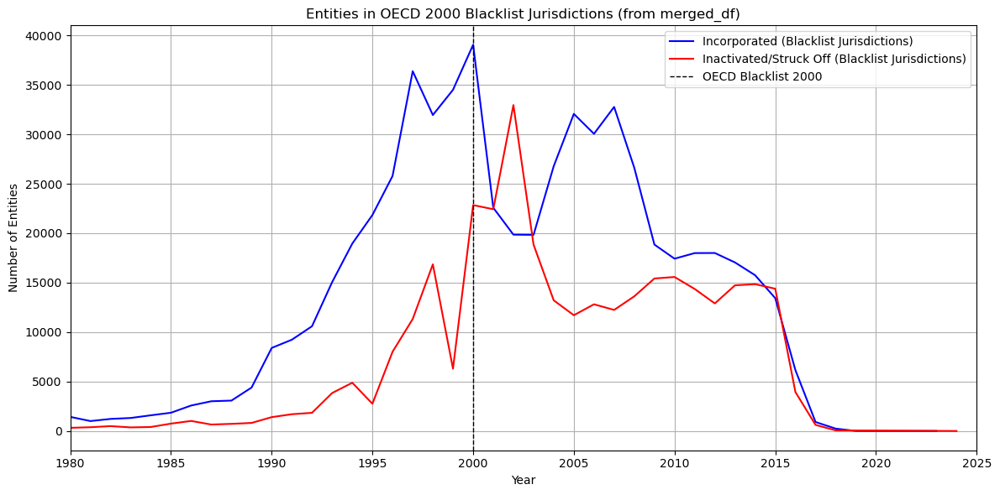


--- Incorporation Trends in Malta, BVI, Bahamas (from merged_df) ---


<Figure size 1400x700 with 0 Axes>

Text(0.5, 1.0, 'Entity Incorporations Over Time: Malta, BVI, Bahamas (from merged_df)')

Text(0.5, 0, 'Year of Incorporation')

Text(0, 0.5, 'Number of Entities Incorporated')

(1980.0, 2024.0)

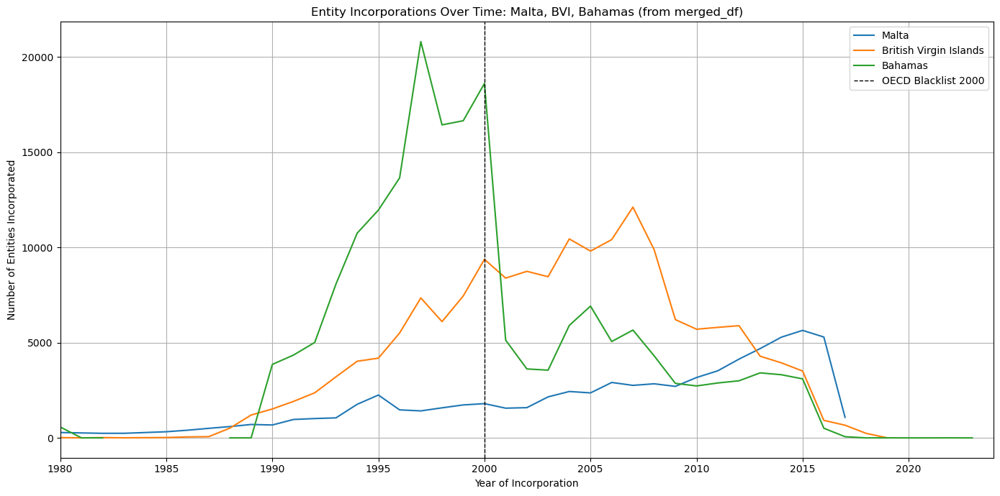


Note on Malta: Malta was not on the OECD 2000 blacklist.
British Virgin Islands on OECD 2000 blacklist: True
Bahamas on OECD 2000 blacklist: True
Further investigation into specific policy changes in BVI and Bahamas post-2000, and reasons for Malta's popularity, would require external research beyond this dataset.


In [33]:
import pandas as pd

import matplotlib.pyplot as plt

# It is assumed that 'normalize_jurisdiction' function and 'oecd_2000_blacklist' list
# are defined and available from previous cells.
# merged_df is also assumed to be loaded.

# --- Preprocessing merged_df ---
# Convert relevant date columns to datetime
merged_df['incorporation_date_end'] = pd.to_datetime(merged_df['incorporation_date_end'], errors='coerce')
# start_date and end_date in merged_df usually refer to relationship start/end, not entity lifecycle
# merged_df['start_date'] = pd.to_datetime(merged_df['start_date'], errors='coerce')
# merged_df['end_date'] = pd.to_datetime(merged_df['end_date'], errors='coerce')

# Normalize jurisdiction for entities (node_end)
merged_df['jurisdiction_norm_end'] = merged_df['jurisdiction_description_end'].apply(normalize_jurisdiction)

# Normalize country for officers (node_start)
merged_df['countries_start_norm'] = merged_df['countries_start'].apply(normalize_jurisdiction)

# --- 1. Officer Registration Analysis ---
print("--- Officer Registration Analysis ---")
officer_entity_links = merged_df[
    (merged_df['node_type_start'] == 'officer') & 
    (merged_df['node_type_end'] == 'entity') &
    (merged_df['countries_start_norm'].notna()) & (merged_df['countries_start_norm'] != '') &
    (merged_df['jurisdiction_norm_end'].notna()) & (merged_df['jurisdiction_norm_end'] != '')
].copy()

if not officer_entity_links.empty:
    officer_entity_links['officer_in_entity_jurisdiction'] = \
        officer_entity_links['countries_start_norm'] == officer_entity_links['jurisdiction_norm_end']
    
    percentage_same_jurisdiction = (officer_entity_links['officer_in_entity_jurisdiction'].sum() * 100.0 / 
                                    len(officer_entity_links))
    print(f"Percentage of officers registered in the same jurisdiction as their entity: {percentage_same_jurisdiction:.2f}%")

    same_jurisdiction_counts = officer_entity_links[officer_entity_links['officer_in_entity_jurisdiction']] \
        .groupby('jurisdiction_norm_end')['node_id_start'] \
        .nunique() \
        .sort_values(ascending=False) \
        .head(10)

    if not same_jurisdiction_counts.empty:
        plt.figure(figsize=(10, 6))
        same_jurisdiction_counts.plot(kind='barh', color='skyblue', edgecolor='black')
        plt.title('Top 10 Jurisdictions: Officers in Same Jurisdiction as Entity')
        plt.xlabel('Number of Unique Officers')
        plt.ylabel('Entity Jurisdiction')
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.show()
    else:
        print("No cases found where officers are registered in the same jurisdiction as their entity.")
else:
    print("No valid officer-to-entity links found for this analysis.")

# --- 2. OECD 2000 Effectiveness (using merged_df for entities) ---
print("\n--- OECD 2000 Blacklist Impact on Entity Incorporations & Inactivations (from merged_df) ---")
entities_from_merged = merged_df[
    (merged_df['node_type_end'] == 'entity') & 
    (merged_df['incorporation_date_end'].notna())
].copy() # Ensure we are working with entities that have an incorporation date

if not entities_from_merged.empty:
    entities_from_merged['incorp_year_end'] = entities_from_merged['incorporation_date_end'].dt.year

    blacklist_entities_merged = entities_from_merged[
        entities_from_merged['jurisdiction_norm_end'].isin(oecd_2000_blacklist)
    ].copy()

    if not blacklist_entities_merged.empty:
        incorp_counts_merged = blacklist_entities_merged.groupby('incorp_year_end')['node_id_end'].nunique().sort_index()
        
        # Entity end dates from merged_df
        blacklist_entities_merged['entity_inactivation_date'] = pd.to_datetime(blacklist_entities_merged['inactivation_date_end'], errors='coerce')
        blacklist_entities_merged['entity_struck_off_date'] = pd.to_datetime(blacklist_entities_merged['struck_off_date_end'], errors='coerce')
        blacklist_entities_merged['entity_end_date_merged'] = blacklist_entities_merged['entity_inactivation_date'].combine_first(blacklist_entities_merged['entity_struck_off_date'])
        
        valid_end_dates_merged = blacklist_entities_merged[blacklist_entities_merged['entity_end_date_merged'].notna()].copy()
        valid_end_dates_merged['entity_end_year_merged'] = valid_end_dates_merged['entity_end_date_merged'].dt.year
        
        end_counts_merged = pd.Series(dtype='int64')
        if not valid_end_dates_merged.empty:
            end_counts_merged = valid_end_dates_merged.groupby('entity_end_year_merged')['node_id_end'].nunique().sort_index()

        plt.figure(figsize=(12, 6))
        if not incorp_counts_merged.empty:
            plt.plot(incorp_counts_merged.index, incorp_counts_merged.values, label='Incorporated (Blacklist Jurisdictions)', color='blue')
        if not end_counts_merged.empty:
            plt.plot(end_counts_merged.index, end_counts_merged.values, label='Inactivated/Struck Off (Blacklist Jurisdictions)', color='red')
        
        plt.axvline(x=2000, color='black', linestyle='--', linewidth=1, label='OECD Blacklist 2000')
        plt.title('Entities in OECD 2000 Blacklist Jurisdictions (from merged_df)')
        plt.xlabel('Year')
        plt.ylabel('Number of Entities')
        
        min_yr, max_yr = 1980, 2025
        if not incorp_counts_merged.empty:
            min_yr = min(min_yr, incorp_counts_merged.index.min())
            max_yr = max(max_yr, incorp_counts_merged.index.max())
        if not end_counts_merged.empty:
            min_yr = min(min_yr, end_counts_merged.index.min())
            max_yr = max(max_yr, end_counts_merged.index.max())
        
        if not incorp_counts_merged.empty or not end_counts_merged.empty:
            plt.xlim(max(1980, min_yr -1), min(2025, max_yr + 1))
            plt.legend()
        else:
            plt.xlim(1980,2025)

        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print("No entities from merged_df found in OECD 2000 blacklist jurisdictions with incorporation dates.")
else:
    print("No entities with incorporation dates found in merged_df for OECD impact analysis.")

# --- 3. Analysis of Malta, BVI, Bahamas ---
print("\n--- Incorporation Trends in Malta, BVI, Bahamas (from merged_df) ---")
target_jurisdictions_names = ['Malta', 'British Virgin Islands', 'Bahamas']
target_jurisdictions_norm = [normalize_jurisdiction(j) for j in target_jurisdictions_names]

# Use entities_from_merged which already has 'incorp_year_end' and 'jurisdiction_norm_end'
if not entities_from_merged.empty:
    specific_jurisdictions_entities = entities_from_merged[
        entities_from_merged['jurisdiction_norm_end'].isin(target_jurisdictions_norm)
    ].copy()

    if not specific_jurisdictions_entities.empty:
        incorp_trends_specific = specific_jurisdictions_entities.groupby(['incorp_year_end', 'jurisdiction_norm_end'])['node_id_end'] \
            .nunique().unstack()

        plt.figure(figsize=(14, 7))
        plot_empty = True
        min_yr_spec, max_yr_spec = 1980, 2025

        if not incorp_trends_specific.empty:
            min_yr_spec = incorp_trends_specific.index.min()
            max_yr_spec = incorp_trends_specific.index.max()
            for jurisdiction_name in target_jurisdictions_names: # Plot with original names for legend
                norm_jurisdiction = normalize_jurisdiction(jurisdiction_name)
                if norm_jurisdiction in incorp_trends_specific.columns:
                    plt.plot(incorp_trends_specific.index, incorp_trends_specific[norm_jurisdiction], label=jurisdiction_name)
                    plot_empty = False
        
        if not plot_empty:
            plt.axvline(x=2000, color='black', linestyle='--', linewidth=1, label='OECD Blacklist 2000')
            plt.title('Entity Incorporations Over Time: Malta, BVI, Bahamas (from merged_df)')
            plt.xlabel('Year of Incorporation')
            plt.ylabel('Number of Entities Incorporated')
            plt.legend()
            plt.grid(True)
            plt.xlim(max(1980, min_yr_spec -1), min(2025, max_yr_spec + 1))
            plt.tight_layout()
            plt.show()
        else:
            print("No incorporation data to plot for Malta, BVI, or Bahamas.")

        print("\nNote on Malta: Malta was not on the OECD 2000 blacklist.")
        bvi_on_list = normalize_jurisdiction('British Virgin Islands') in oecd_2000_blacklist
        bahamas_on_list = normalize_jurisdiction('Bahamas') in oecd_2000_blacklist
        print(f"British Virgin Islands on OECD 2000 blacklist: {bvi_on_list}")
        print(f"Bahamas on OECD 2000 blacklist: {bahamas_on_list}")
        print("Further investigation into specific policy changes in BVI and Bahamas post-2000, and reasons for Malta's popularity, would require external research beyond this dataset.")

    else:
        print("No entities found in Malta, BVI, or Bahamas in merged_df.")
else:
    print("No entities with incorporation dates found in merged_df for Malta, BVI, Bahamas analysis.")


In [36]:
import pandas as pd

# Load only needed columns to reduce memory usage
usecols = ['node_id_start','node_id_end','node_type_start','node_type_end',
           'rel_type','countries_start','country_codes_start',
           'jurisdiction_description_end','incorporation_date_end','inactivation_date_end']
df = pd.read_csv('ICIJ_Merged.csv', usecols=usecols, parse_dates=['incorporation_date_end','inactivation_date_end'])
# Filter to officer->entity relationships
officer_rels = df[df['rel_type']=='officer_of'].copy()
# Drop records with missing jurisdiction or officer country info (cannot determine locality)
officer_rels = officer_rels[ officer_rels['jurisdiction_description_end'].notna() ]
officer_rels = officer_rels[ officer_rels['jurisdiction_description_end']!='Undetermined' ]
officer_rels = officer_rels[ officer_rels['countries_start'].notna() ]

# Create indicator if officer and entity share the same jurisdiction
# We'll compare officer country list to entity jurisdiction (case-insensitive match)
def is_local_officer(officer_countries, entity_jur):
    officer_countries = {c.strip().lower() for c in officer_countries.split(';') if c not in ["", "Not identified", "Undetermined"]}
    return entity_jur.lower() in officer_countries

officer_rels['officer_local'] = officer_rels.apply(lambda row: is_local_officer(row['countries_start'], row['jurisdiction_description_end']), axis=1)

# Split data into pre-2000 vs post-2000 based on entity incorporation year
officer_rels['inc_year'] = officer_rels['incorporation_date_end'].dt.year
pre_officer = officer_rels[ officer_rels['inc_year'] < 2000 ]
post_officer = officer_rels[ officer_rels['inc_year'] >= 2000 ]

# Calculate counts for local vs foreign officers in each period
local_pre = pre_officer['officer_local'].sum()
foreign_pre = len(pre_officer) - local_pre
local_post = post_officer['officer_local'].sum()
foreign_post = len(post_officer) - local_post

print("Pre-2000: %d officer relationships (local officers: %d, foreign officers: %d)" % (len(pre_officer), local_pre, foreign_pre))
print("Post-2000: %d officer relationships (local officers: %d, foreign officers: %d)" % (len(post_officer), local_post, foreign_post))


/var/folders/5x/0sqjbpy13p3gzjlddpxqjtfw0000gn/T/ipykernel_82459/3747113231.py:7: DtypeWarning: Columns (10,11,42) have mixed types. Specify dtype option on import or set low_memory=False.
/var/folders/5x/0sqjbpy13p3gzjlddpxqjtfw0000gn/T/ipykernel_82459/3747113231.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.


Pre-2000: 325924 officer relationships (local officers: 182773, foreign officers: 143151)
Post-2000: 916148 officer relationships (local officers: 389252, foreign officers: 526896)


Chi-square stat = 17872.30, p-value = 0.0000
Percentage of officers local to entity jurisdiction:
Pre-2000: 56.1%
Post-2000: 42.5%


<Figure size 400x400 with 0 Axes>

<BarContainer object of 2 artists>

Text(0, 57.07841091788269, '56.1%')

Text(1, 43.48789496893515, '42.5%')

(0.0, 100.0)

Text(0, 0.5, '% Officer-Local')

Text(0.5, 1.0, 'Local Officers for Offshore Entities\n(pre-2000 vs post-2000)')

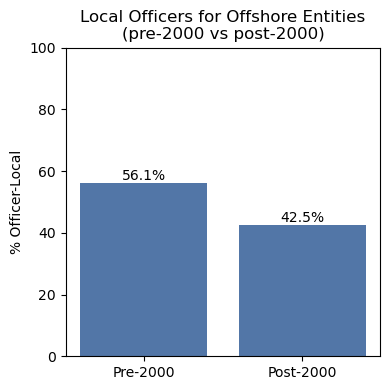

In [37]:
import numpy as np
from math import isnan

# Chi-square test for the 2x2 contingency table
obs = np.array([[local_pre, foreign_pre],[local_post, foreign_post]])
# expected counts under independence
row_sums = obs.sum(axis=1, keepdims=True)
col_sums = obs.sum(axis=0, keepdims=True)
total = obs.sum()
expected = row_sums * col_sums / total
chi2_stat = ((obs - expected)**2 / expected).sum()
# Degrees of freedom = 1
from math import sqrt
from scipy.stats import chi2
p_val = 1 - chi2.cdf(chi2_stat, df=1)
print("Chi-square stat = %.2f, p-value = %.4f" % (chi2_stat, p_val))

# Compute percentages of local officers in each period
perc_local_pre = local_pre / (local_pre + foreign_pre) * 100
perc_local_post = local_post / (local_post + foreign_post) * 100

print("Percentage of officers local to entity jurisdiction:")
print("Pre-2000: %.1f%%" % perc_local_pre)
print("Post-2000: %.1f%%" % perc_local_post)

# Bar plot of percentage of local officers pre vs post
import matplotlib.pyplot as plt
plt.figure(figsize=(4,4))
plt.bar(['Pre-2000','Post-2000'], [perc_local_pre, perc_local_post], color=['#5276A7','#5276A7'])
for i, perc in enumerate([perc_local_pre, perc_local_post]):
    plt.text(i, perc+1, f"{perc:.1f}%", ha='center')
plt.ylim(0, 100)
plt.ylabel("% Officer-Local")
plt.title("Local Officers for Offshore Entities\n(pre-2000 vs post-2000)")
plt.tight_layout()
plt.show()


Text(0.5, 0, 'Year')

Text(0, 0.5, 'Number of Entities')

Text(0.5, 1.0, 'Offshore Entities Incorporated vs. Inactivated per Year')

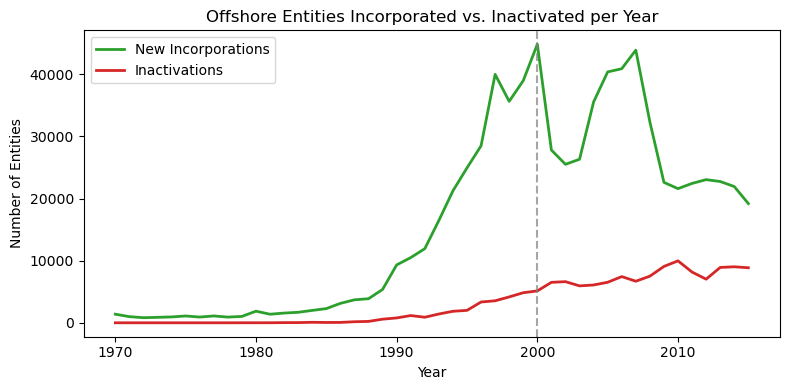

In [38]:
# Build a DataFrame of unique entities with incorporation and termination years
# We will combine entities that appear as node_type_end or node_type_start
entities_end = df[df['node_type_end']=='entity'][['node_id_end','jurisdiction_description_end','incorporation_date_end','inactivation_date_end']]
entities_start = df[df['node_type_start']=='entity'][['node_id_start','jurisdiction_description_end','incorporation_date_end','inactivation_date_end']]
entities_start = entities_start.rename(columns={'node_id_start':'node_id_end'})  # unify column name for node id
entity_df = pd.concat([entities_end, entities_start], ignore_index=True)
entity_df = entity_df.drop_duplicates(subset='node_id_end')  # unique entities by node id

# Parse dates and get years
entity_df['incorporation_date_end'] = pd.to_datetime(entity_df['incorporation_date_end'], errors='coerce')
entity_df['inactivation_date_end'] = pd.to_datetime(entity_df['inactivation_date_end'], errors='coerce')
entity_df['inc_year'] = entity_df['incorporation_date_end'].dt.year
entity_df['inact_year'] = entity_df['inactivation_date_end'].dt.year

# Filter to a reasonable timeframe (1970-2015)
inc_counts = entity_df['inc_year'].value_counts().sort_index()
inact_counts = entity_df['inact_year'].value_counts().sort_index()

# Restrict to 1970-2015 for plotting
inc_counts = inc_counts[(inc_counts.index >= 1970) & (inc_counts.index <= 2015)]
inact_counts = inact_counts[(inact_counts.index >= 1970) & (inact_counts.index <= 2015)]

# Plot incorporations and inactivations over time
years = range(1970, 2016)
inc_vals = [inc_counts.get(y, 0) for y in years]
inact_vals = [inact_counts.get(y, 0) for y in years]

fig, ax = plt.subplots(figsize=(8,4))
ax.plot(years, inc_vals, label='New Incorporations', color='#2ca02c', linewidth=2)
ax.plot(years, inact_vals, label='Inactivations', color='#d62728', linewidth=2)
ax.axvline(x=2000, color='gray', linestyle='--', alpha=0.7)
ax.set_xlabel("Year")
ax.set_ylabel("Number of Entities")
ax.set_title("Offshore Entities Incorporated vs. Inactivated per Year")
ax.legend()
plt.tight_layout()
plt.show()


<Figure size 800x400 with 0 Axes>

(1970.0, 2015.0)

(0.0, 21840.0)

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Entities Incorporated')

Text(0.5, 1.0, 'Annual Incorporations in Malta, BVI, and Bahamas')

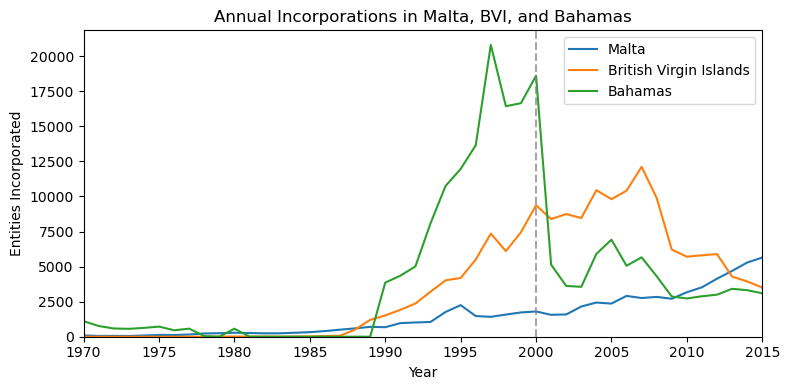

| Jurisdiction           |   Entities pre-2000 |   Entities 2000+ |   Total |
|:-----------------------|--------------------:|-----------------:|--------:|
| Malta                  |               19682 |            55938 |   75620 |
| British Virgin Islands |               45545 |           124787 |  170332 |
| Bahamas                |              128182 |            80647 |  208829 |


In [39]:
# Filter entity data for Malta, BVI, Bahamas and count incorporations by year
focus_jurs = ["Malta", "British Virgin Islands", "Bahamas"]
focus_entities = entity_df[ entity_df['jurisdiction_description_end'].isin(focus_jurs) ].copy()
# count incorporations per year for each jurisdiction
inc_byjur_year = focus_entities.groupby(['jurisdiction_description_end','inc_year']).size().reset_index(name='count')

# Pivot to get years as index, jurisdictions as columns
pivot = inc_byjur_year.pivot(index='inc_year', columns='jurisdiction_description_end', values='count').fillna(0)

# Plot lines for each jurisdiction
plt.figure(figsize=(8,4))
for jur in focus_jurs:
    plt.plot(pivot.index, pivot[jur] if jur in pivot else [0]*len(pivot.index), label=jur)
plt.axvline(x=2000, color='gray', linestyle='--', alpha=0.7)
plt.xlim(1970, 2015)
plt.ylim(0, None)
plt.xlabel("Year")
plt.ylabel("Entities Incorporated")
plt.title("Annual Incorporations in Malta, BVI, and Bahamas")
plt.legend()
plt.tight_layout()
plt.show()

# Prepare summary table of pre/post counts
summary = []
for jur in focus_jurs:
    jur_entities = focus_entities[ focus_entities['jurisdiction_description_end']==jur ]
    pre_count = sum(jur_entities['inc_year'] < 2000)
    post_count = sum(jur_entities['inc_year'] >= 2000)
    total_count = pre_count + post_count
    summary.append([jur, pre_count, post_count, total_count])
summary_df = pd.DataFrame(summary, columns=["Jurisdiction","Entities pre-2000","Entities 2000+","Total"])
print(summary_df.to_markdown(index=False))


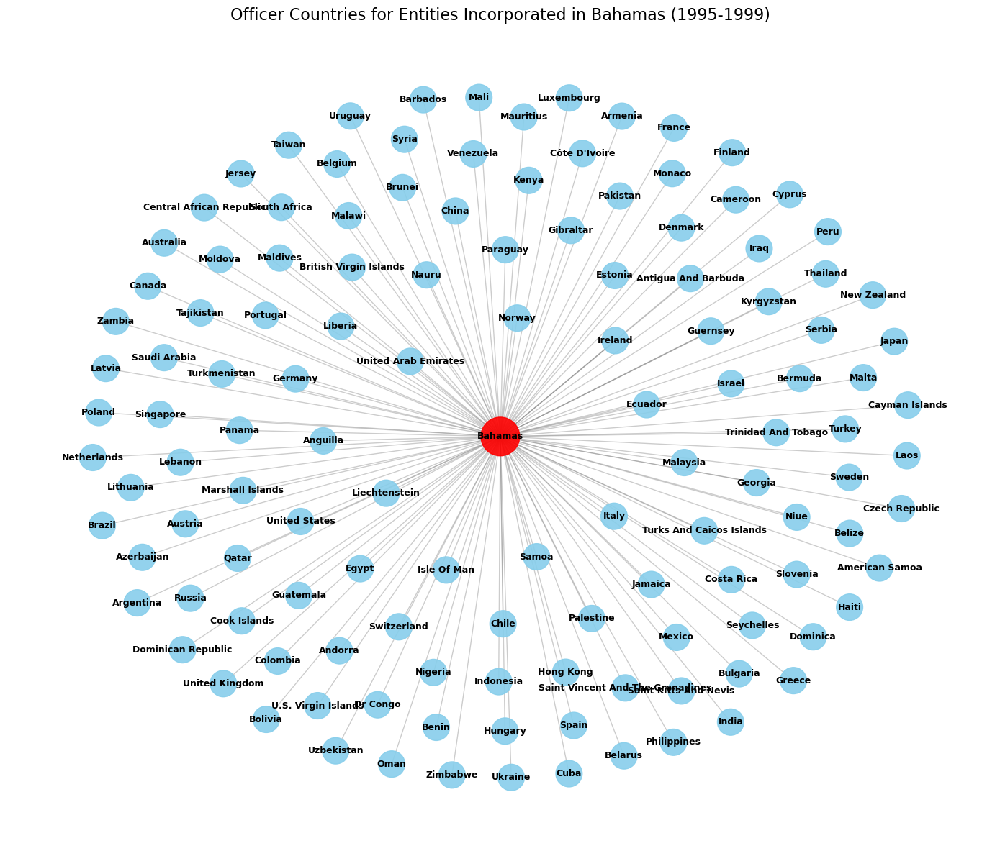

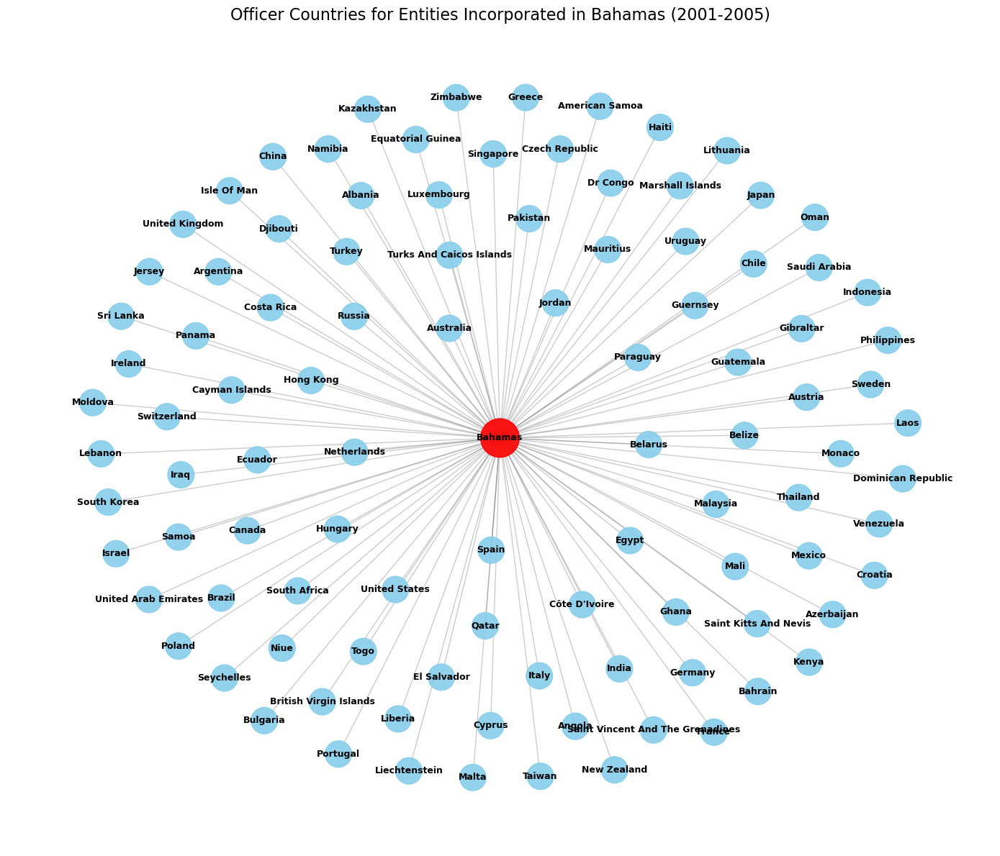

Pre-sanction (1995-1999) Bahamas officer relationships found: 5411
Pre-sanction (1995-1999) graph for Bahamas: 128 nodes, 127 edges.
Post-sanction (2001-2005) Bahamas officer relationships found: 1768
Post-sanction (2001-2005) graph for Bahamas: 102 nodes, 101 edges.


In [40]:
import networkx as nx
import pandas as pd

import matplotlib.pyplot as plt

# Ensure officer_rels DataFrame is available from CELL 17 and has the 'inc_year' column.
# If 'inc_year' is not already int, or might contain NaNs from NaT dates:
if 'inc_year' not in officer_rels.columns:
    officer_rels['inc_year'] = officer_rels['incorporation_date_end'].dt.year

# Make a copy to avoid SettingWithCopyWarning if officer_rels is a slice
officer_rels_processed = officer_rels.copy()
officer_rels_processed.dropna(subset=['inc_year'], inplace=True)
officer_rels_processed['inc_year'] = officer_rels_processed['inc_year'].astype(int)


target_jurisdiction = "Bahamas"
target_jurisdiction_lower = target_jurisdiction.lower()

# Define time periods
pre_start_year = 1995
pre_end_year = 1999
post_start_year = 2001
post_end_year = 2005

# Function to parse and clean officer countries from the 'countries_start' string
def get_clean_officer_countries(countries_str):
    if pd.isna(countries_str):
        return set()
    # Split by ';', strip whitespace, convert to lowercase, and filter out common non-informative values
    return {
        c.strip().lower() for c in str(countries_str).split(';') 
        if c.strip() and c.strip().lower() not in ["not identified", "undetermined", ""]
    }

# Filter data for entities in Bahamas
bahamas_officer_rels = officer_rels_processed[
    officer_rels_processed['jurisdiction_description_end'] == target_jurisdiction
].copy()

# Pre-sanction data for Bahamas
df_bahamas_pre = bahamas_officer_rels[
    (bahamas_officer_rels['inc_year'] >= pre_start_year) &
    (bahamas_officer_rels['inc_year'] <= pre_end_year)
]

# Post-sanction data for Bahamas
df_bahamas_post = bahamas_officer_rels[
    (bahamas_officer_rels['inc_year'] >= post_start_year) &
    (bahamas_officer_rels['inc_year'] <= post_end_year)
]

# Function to build the network for a given period
def build_bahamas_officer_network(df, entity_jur_name):
    G = nx.Graph()
    entity_jur_name_lower = entity_jur_name.lower()
    
    if not df.empty:
        G.add_node(entity_jur_name) # Add the main jurisdiction node (e.g., "Bahamas")
        
        for _, row in df.iterrows():
            officer_countries = get_clean_officer_countries(row['countries_start'])
            for country_lower in officer_countries:
                # Avoid self-loops if an officer is from Bahamas itself for a Bahamian entity
                if country_lower != entity_jur_name_lower and country_lower: 
                    # Use title case for officer country nodes for better readability
                    officer_node_name = country_lower.title() 
                    G.add_node(officer_node_name)
                    G.add_edge(officer_node_name, entity_jur_name)
    return G

# Build the networks
G_pre_bahamas = build_bahamas_officer_network(df_bahamas_pre, target_jurisdiction)
G_post_bahamas = build_bahamas_officer_network(df_bahamas_post, target_jurisdiction)

# Function to visualize the network
def plot_officer_network(G, title_str, target_node_name):
    plt.figure(figsize=(14, 12)) # Adjusted figure size
    if not G.nodes():
        plt.title(f"{title_str} (No data to display)")
        plt.axis('off')
        plt.show()
        return
        
    pos = nx.spring_layout(G, k=0.6, iterations=50, seed=42) # Adjusted layout parameters
    
    node_colors = []
    node_sizes = []
    for node in G.nodes():
        if node == target_node_name:
            node_colors.append('red')
            node_sizes.append(1500)
        else:
            node_colors.append('skyblue')
            node_sizes.append(700)
            
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9)
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.4, edge_color='gray')
    nx.draw_networkx_labels(G, pos, font_size=9, font_weight='bold')
    
    plt.title(title_str, fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot the networks
plot_officer_network(G_pre_bahamas, 
                     f"Officer Countries for Entities Incorporated in {target_jurisdiction} ({pre_start_year}-{pre_end_year})", 
                     target_jurisdiction)

plot_officer_network(G_post_bahamas, 
                     f"Officer Countries for Entities Incorporated in {target_jurisdiction} ({post_start_year}-{post_end_year})", 
                     target_jurisdiction)

print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) Bahamas officer relationships found: {df_bahamas_pre.shape[0]}")
if not G_pre_bahamas.nodes():
    print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) graph for {target_jurisdiction} is empty.")
else:
    print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) graph for {target_jurisdiction}: {len(G_pre_bahamas.nodes())} nodes, {len(G_pre_bahamas.edges())} edges.")

print(f"Post-sanction ({post_start_year}-{post_end_year}) Bahamas officer relationships found: {df_bahamas_post.shape[0]}")
if not G_post_bahamas.nodes():
     print(f"Post-sanction ({post_start_year}-{post_end_year}) graph for {target_jurisdiction} is empty.")
else:
    print(f"Post-sanction ({post_start_year}-{post_end_year}) graph for {target_jurisdiction}: {len(G_post_bahamas.nodes())} nodes, {len(G_post_bahamas.edges())} edges.")


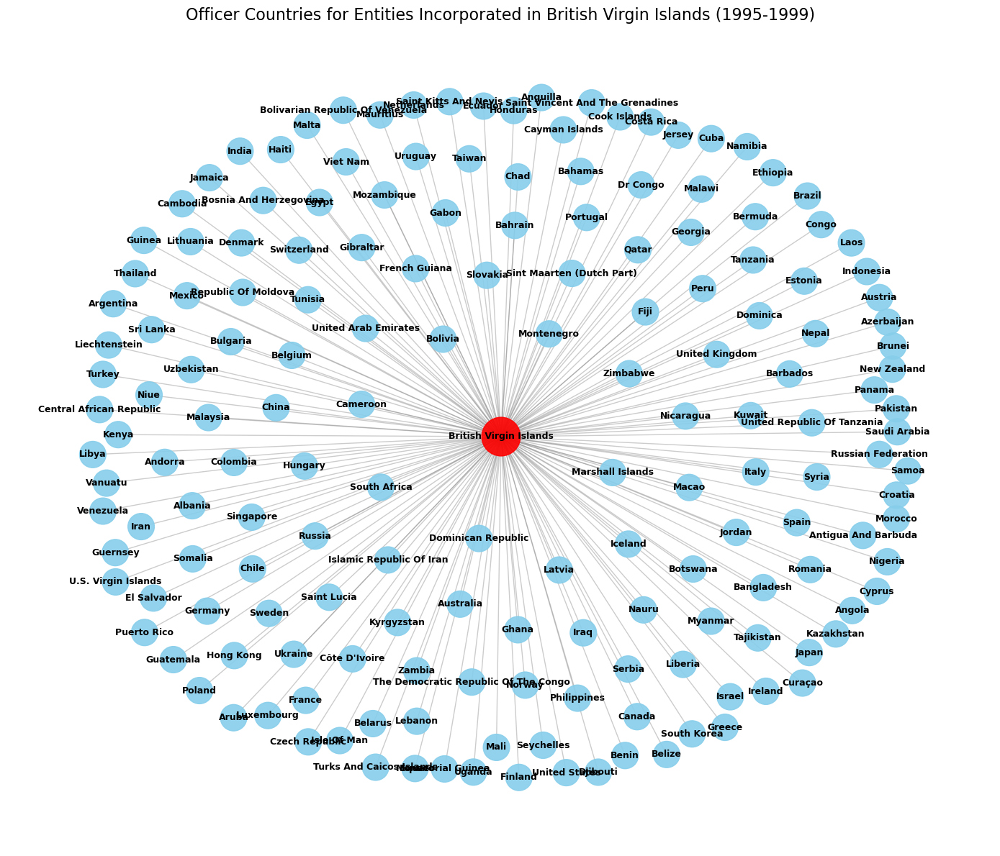

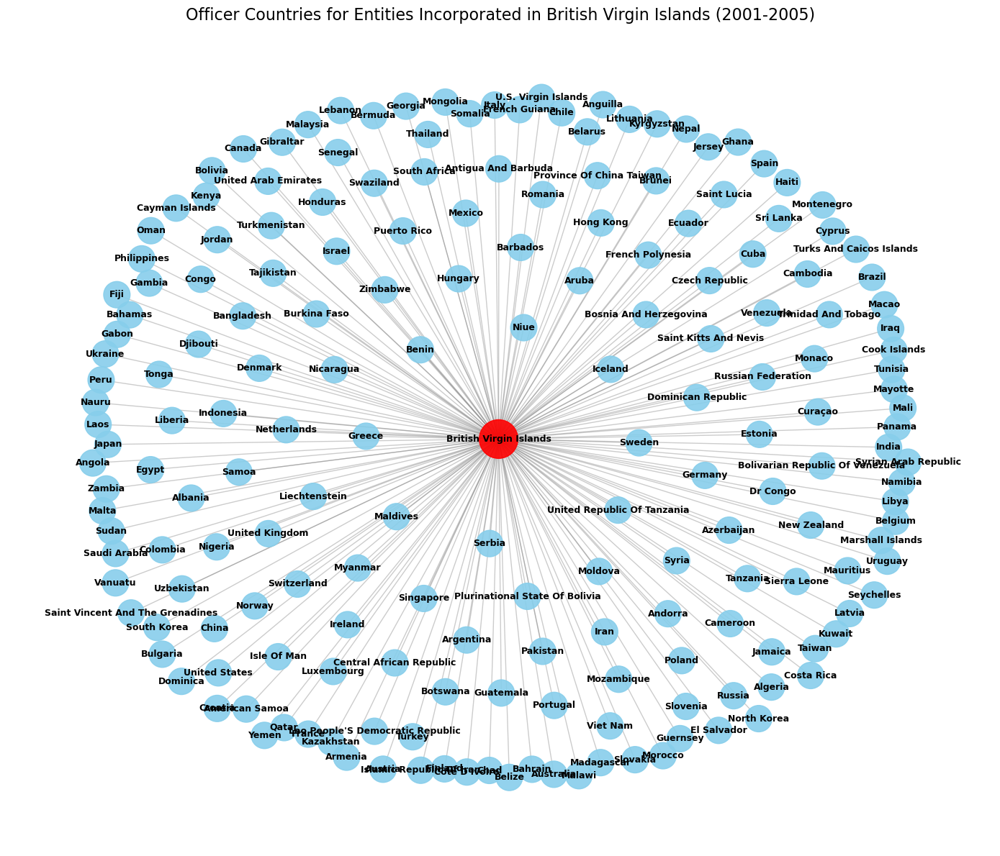

Pre-sanction (1995-1999) British Virgin Islands officer relationships found: 50317
Pre-sanction (1995-1999) graph for British Virgin Islands: 173 nodes, 172 edges.
Post-sanction (2001-2005) British Virgin Islands officer relationships found: 104800
Post-sanction (2001-2005) graph for British Virgin Islands: 192 nodes, 191 edges.


In [41]:
import networkx as nx
import pandas as pd

import matplotlib.pyplot as plt

# Ensure officer_rels_processed DataFrame is available and processed as in CELL 22
# If not, re-run the initial processing steps from CELL 22 for officer_rels_processed:
if 'officer_rels_processed' not in globals() or not isinstance(officer_rels_processed, pd.DataFrame):
    print("Warning: 'officer_rels_processed' not found. Re-initializing from 'officer_rels'.")
    if 'officer_rels' not in globals():
        # Attempt to re-create officer_rels from df if it exists
        if 'df' in globals() and isinstance(df, pd.DataFrame) and 'rel_type' in df.columns:
            officer_rels = df[df['rel_type']=='officer_of'].copy()
            officer_rels = officer_rels[ officer_rels['jurisdiction_description_end'].notna() ]
            officer_rels = officer_rels[ officer_rels['jurisdiction_description_end']!='Undetermined' ]
            officer_rels = officer_rels[ officer_rels['countries_start'].notna() ]
            def is_local_officer(officer_countries, entity_jur):
                officer_countries = {c.strip().lower() for c in officer_countries.split(';') if c not in ["", "Not identified", "Undetermined"]}
                return entity_jur.lower() in officer_countries
            officer_rels['officer_local'] = officer_rels.apply(lambda row: is_local_officer(row['countries_start'], row['jurisdiction_description_end']), axis=1)
            officer_rels['incorporation_date_end'] = pd.to_datetime(officer_rels['incorporation_date_end'], errors='coerce')
        else:
            raise NameError("Required DataFrame 'df' or 'officer_rels' not found to create 'officer_rels_processed'. Please ensure previous cells are run.")

    officer_rels_processed = officer_rels.copy()
    if 'incorporation_date_end' not in officer_rels_processed.columns or officer_rels_processed['incorporation_date_end'].dtype != 'datetime64[ns]':
        officer_rels_processed['incorporation_date_end'] = pd.to_datetime(officer_rels_processed['incorporation_date_end'], errors='coerce')
    
    if 'inc_year' not in officer_rels_processed.columns:
        officer_rels_processed['inc_year'] = officer_rels_processed['incorporation_date_end'].dt.year
    
    officer_rels_processed.dropna(subset=['inc_year'], inplace=True)
    officer_rels_processed['inc_year'] = officer_rels_processed['inc_year'].astype(int)


# Define the new target jurisdiction
target_jurisdiction_bvi = "British Virgin Islands"
target_jurisdiction_bvi_lower = target_jurisdiction_bvi.lower()

# Time periods remain the same as defined in CELL 22
# pre_start_year = 1995
# pre_end_year = 1999
# post_start_year = 2001
# post_end_year = 2005

# Function to parse and clean officer countries (re-defined for clarity or use from CELL 22 if preferred)
def get_clean_officer_countries(countries_str):
    if pd.isna(countries_str):
        return set()
    return {
        c.strip().lower() for c in str(countries_str).split(';')
        if c.strip() and c.strip().lower() not in ["not identified", "undetermined", ""]
    }

# Filter data for entities in British Virgin Islands
bvi_officer_rels = officer_rels_processed[
    officer_rels_processed['jurisdiction_description_end'] == target_jurisdiction_bvi
].copy()

# Pre-sanction data for BVI
df_bvi_pre = bvi_officer_rels[
    (bvi_officer_rels['inc_year'] >= pre_start_year) &
    (bvi_officer_rels['inc_year'] <= pre_end_year)
]

# Post-sanction data for BVI
df_bvi_post = bvi_officer_rels[
    (bvi_officer_rels['inc_year'] >= post_start_year) &
    (bvi_officer_rels['inc_year'] <= post_end_year)
]

# Re-use the network building function from CELL 22 (or define it here if it's not globally available)
# Assuming build_bahamas_officer_network is available from CELL 22, we can rename it or make it generic.
# For this cell, let's define a generic version.
def build_officer_network_for_jurisdiction(df, entity_jur_name):
    G = nx.Graph()
    entity_jur_name_lower = entity_jur_name.lower()
    
    if not df.empty:
        G.add_node(entity_jur_name) 
        
        for _, row in df.iterrows():
            officer_countries = get_clean_officer_countries(row['countries_start'])
            for country_lower in officer_countries:
                if country_lower != entity_jur_name_lower and country_lower: 
                    officer_node_name = country_lower.title() 
                    G.add_node(officer_node_name)
                    G.add_edge(officer_node_name, entity_jur_name)
    return G

# Build the networks for BVI
G_pre_bvi = build_officer_network_for_jurisdiction(df_bvi_pre, target_jurisdiction_bvi)
G_post_bvi = build_officer_network_for_jurisdiction(df_bvi_post, target_jurisdiction_bvi)

# Re-use the plotting function from CELL 22
# Assuming plot_officer_network is available from CELL 22
def plot_officer_network(G, title_str, target_node_name):
    plt.figure(figsize=(14, 12))
    if not G.nodes():
        plt.title(f"{title_str} (No data to display)")
        plt.axis('off')
        plt.show()
        return
        
    pos = nx.spring_layout(G, k=0.6, iterations=50, seed=42) 
    
    node_colors = []
    node_sizes = []
    for node in G.nodes():
        if node == target_node_name:
            node_colors.append('red')
            node_sizes.append(1500)
        else:
            node_colors.append('skyblue')
            node_sizes.append(700)
            
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9)
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.4, edge_color='gray')
    nx.draw_networkx_labels(G, pos, font_size=9, font_weight='bold')
    
    plt.title(title_str, fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot the networks for BVI
plot_officer_network(G_pre_bvi,
                     f"Officer Countries for Entities Incorporated in {target_jurisdiction_bvi} ({pre_start_year}-{pre_end_year})",
                     target_jurisdiction_bvi)

plot_officer_network(G_post_bvi,
                     f"Officer Countries for Entities Incorporated in {target_jurisdiction_bvi} ({post_start_year}-{post_end_year})",
                     target_jurisdiction_bvi)

print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) {target_jurisdiction_bvi} officer relationships found: {df_bvi_pre.shape[0]}")
if not G_pre_bvi.nodes():
    print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) graph for {target_jurisdiction_bvi} is empty.")
else:
    print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) graph for {target_jurisdiction_bvi}: {len(G_pre_bvi.nodes())} nodes, {len(G_pre_bvi.edges())} edges.")

print(f"Post-sanction ({post_start_year}-{post_end_year}) {target_jurisdiction_bvi} officer relationships found: {df_bvi_post.shape[0]}")
if not G_post_bvi.nodes():
     print(f"Post-sanction ({post_start_year}-{post_end_year}) graph for {target_jurisdiction_bvi} is empty.")
else:
    print(f"Post-sanction ({post_start_year}-{post_end_year}) graph for {target_jurisdiction_bvi}: {len(G_post_bvi.nodes())} nodes, {len(G_post_bvi.edges())} edges.")

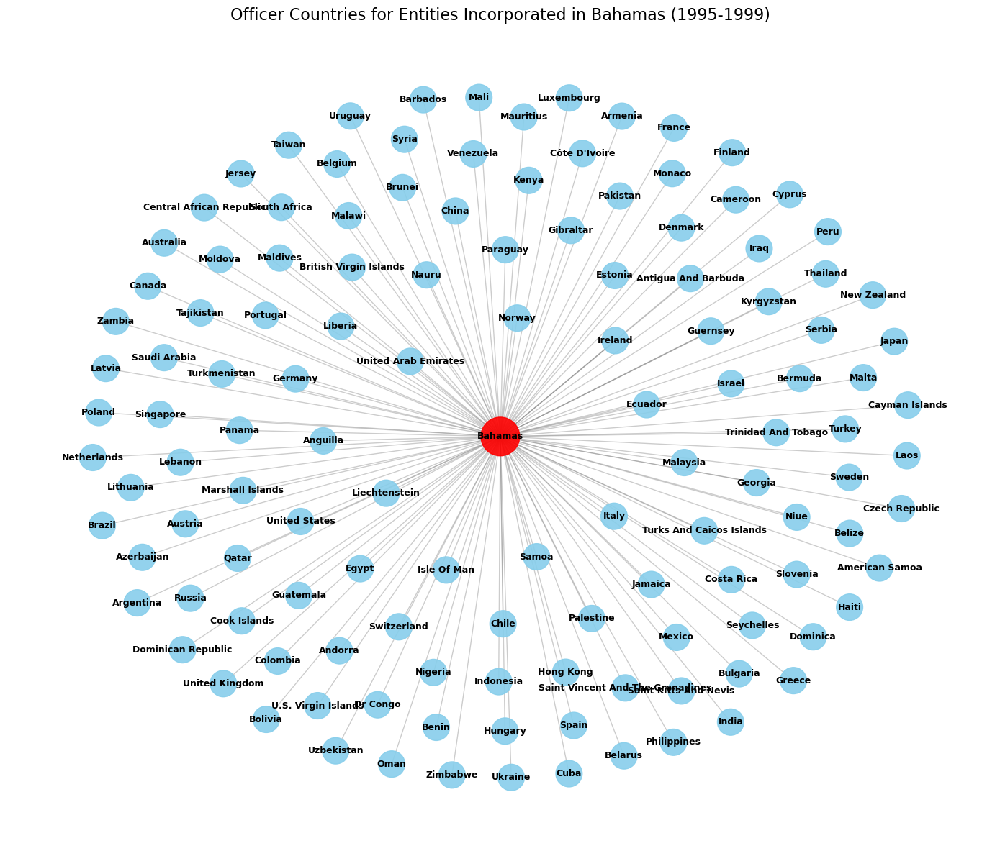

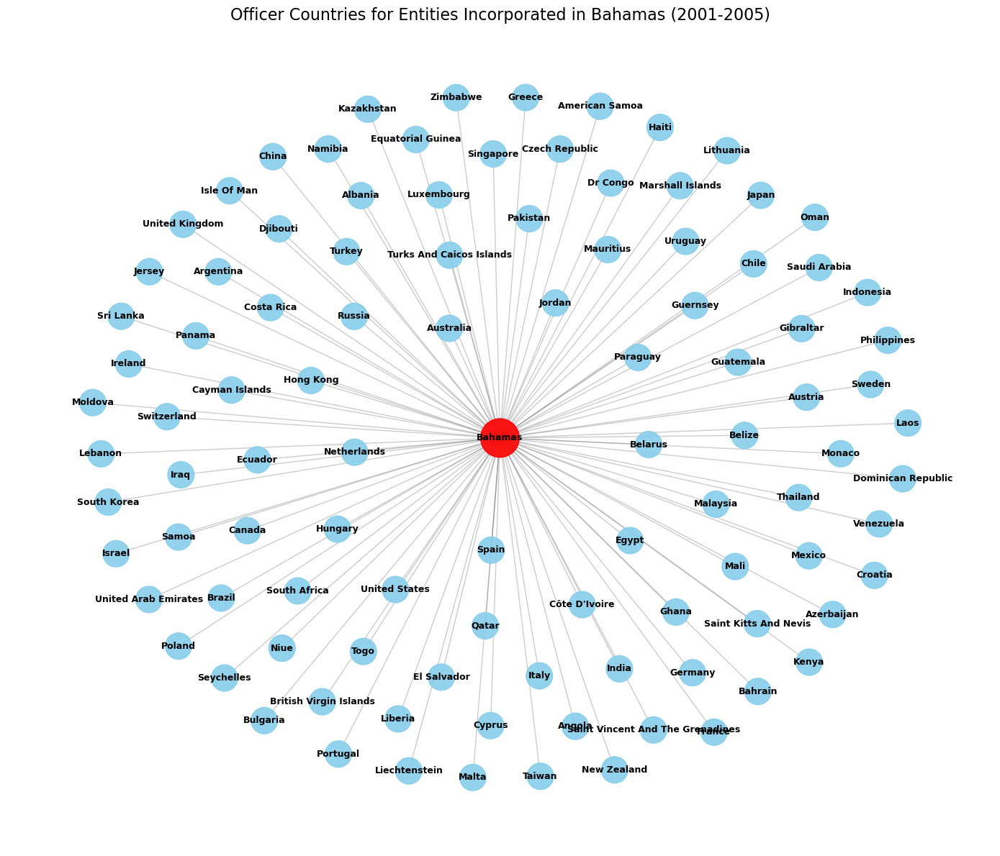

Pre-sanction (1995-1999) Bahamas officer relationships found: 5411
Pre-sanction (1995-1999) graph for Bahamas: 128 nodes, 127 edges.
Post-sanction (2001-2005) Bahamas officer relationships found: 1768
Post-sanction (2001-2005) graph for Bahamas: 102 nodes, 101 edges.


In [42]:
# Ensure officer_rels DataFrame is available from CELL 17 and has the 'inc_year' column.
# If 'inc_year' is not already int, or might contain NaNs from NaT dates:
if 'inc_year' not in officer_rels.columns:
    officer_rels['inc_year'] = officer_rels['incorporation_date_end'].dt.year

# Make a copy to avoid SettingWithCopyWarning if officer_rels is a slice
officer_rels_processed = officer_rels.copy()
# Drop rows where 'inc_year' might be NaN (e.g., if 'incorporation_date_end' was NaT)
officer_rels_processed.dropna(subset=['inc_year'], inplace=True)
officer_rels_processed['inc_year'] = officer_rels_processed['inc_year'].astype(int)


target_jurisdiction = "Bahamas"
target_jurisdiction_lower = target_jurisdiction.lower()

# Define time periods
pre_start_year = 1995
pre_end_year = 1999
post_start_year = 2001
post_end_year = 2005

# Function to parse and clean officer countries from the 'countries_start' string
def get_clean_officer_countries(countries_str):
    if pd.isna(countries_str):
        return set()
    # Split by ';', strip whitespace, convert to lowercase, and filter out common non-informative values
    return {
        c.strip().lower() for c in str(countries_str).split(';') 
        if c.strip() and c.strip().lower() not in ["not identified", "undetermined", ""]
    }

# Filter data for entities in Bahamas
bahamas_officer_rels = officer_rels_processed[
    officer_rels_processed['jurisdiction_description_end'] == target_jurisdiction
].copy()

# Pre-sanction data for Bahamas
df_bahamas_pre = bahamas_officer_rels[
    (bahamas_officer_rels['inc_year'] >= pre_start_year) &
    (bahamas_officer_rels['inc_year'] <= pre_end_year)
]

# Post-sanction data for Bahamas
df_bahamas_post = bahamas_officer_rels[
    (bahamas_officer_rels['inc_year'] >= post_start_year) &
    (bahamas_officer_rels['inc_year'] <= post_end_year)
]

# Function to build the network for a given period
# Renamed from build_bahamas_officer_network to be more generic if reused
def build_officer_network_for_jurisdiction(df, entity_jur_name):
    G = nx.Graph()
    entity_jur_name_lower = entity_jur_name.lower()
    
    if not df.empty:
        G.add_node(entity_jur_name) # Add the main jurisdiction node (e.g., "Bahamas")
        
        for _, row in df.iterrows():
            officer_countries = get_clean_officer_countries(row['countries_start'])
            for country_lower in officer_countries:
                # Avoid self-loops if an officer is from the target jurisdiction itself
                if country_lower != entity_jur_name_lower and country_lower: 
                    # Use title case for officer country nodes for better readability
                    officer_node_name = country_lower.title() 
                    G.add_node(officer_node_name)
                    G.add_edge(officer_node_name, entity_jur_name)
    return G

# Build the networks
G_pre_bahamas = build_officer_network_for_jurisdiction(df_bahamas_pre, target_jurisdiction)
G_post_bahamas = build_officer_network_for_jurisdiction(df_bahamas_post, target_jurisdiction)

# Function to visualize the network
def plot_officer_network(G, title_str, target_node_name):
    plt.figure(figsize=(14, 12)) # Adjusted figure size
    if not G.nodes():
        plt.title(f"{title_str} (No data to display)")
        plt.axis('off')
        plt.show()
        return
        
    pos = nx.spring_layout(G, k=0.6, iterations=50, seed=42) # Adjusted layout parameters
    
    node_colors = []
    node_sizes = []
    for node in G.nodes():
        if node == target_node_name:
            node_colors.append('red')
            node_sizes.append(1500)
        else:
            node_colors.append('skyblue')
            node_sizes.append(700)
            
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9)
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.4, edge_color='gray')
    nx.draw_networkx_labels(G, pos, font_size=9, font_weight='bold')
    
    plt.title(title_str, fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot the networks
plot_officer_network(G_pre_bahamas, 
                     f"Officer Countries for Entities Incorporated in {target_jurisdiction} ({pre_start_year}-{pre_end_year})", 
                     target_jurisdiction)

plot_officer_network(G_post_bahamas, 
                     f"Officer Countries for Entities Incorporated in {target_jurisdiction} ({post_start_year}-{post_end_year})", 
                     target_jurisdiction)

print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) Bahamas officer relationships found: {df_bahamas_pre.shape[0]}")
if not G_pre_bahamas.nodes():
    print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) graph for {target_jurisdiction} is empty.")
else:
    print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) graph for {target_jurisdiction}: {len(G_pre_bahamas.nodes())} nodes, {len(G_pre_bahamas.edges())} edges.")

print(f"Post-sanction ({post_start_year}-{post_end_year}) Bahamas officer relationships found: {df_bahamas_post.shape[0]}")
if not G_post_bahamas.nodes():
     print(f"Post-sanction ({post_start_year}-{post_end_year}) graph for {target_jurisdiction} is empty.")
else:
    print(f"Post-sanction ({post_start_year}-{post_end_year}) graph for {target_jurisdiction}: {len(G_post_bahamas.nodes())} nodes, {len(G_post_bahamas.edges())} edges.")

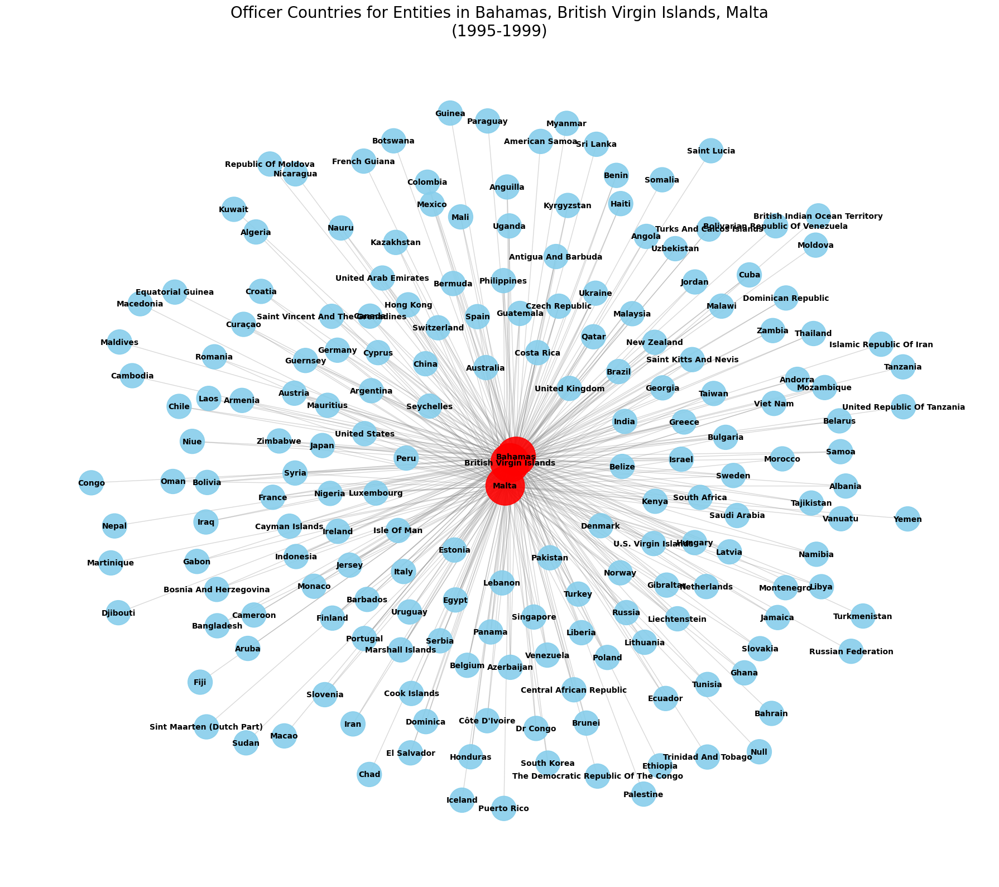

Pre-sanction (1995-1999) combined graph for Bahamas, British Virgin Islands, Malta: 190 nodes, 411 edges.


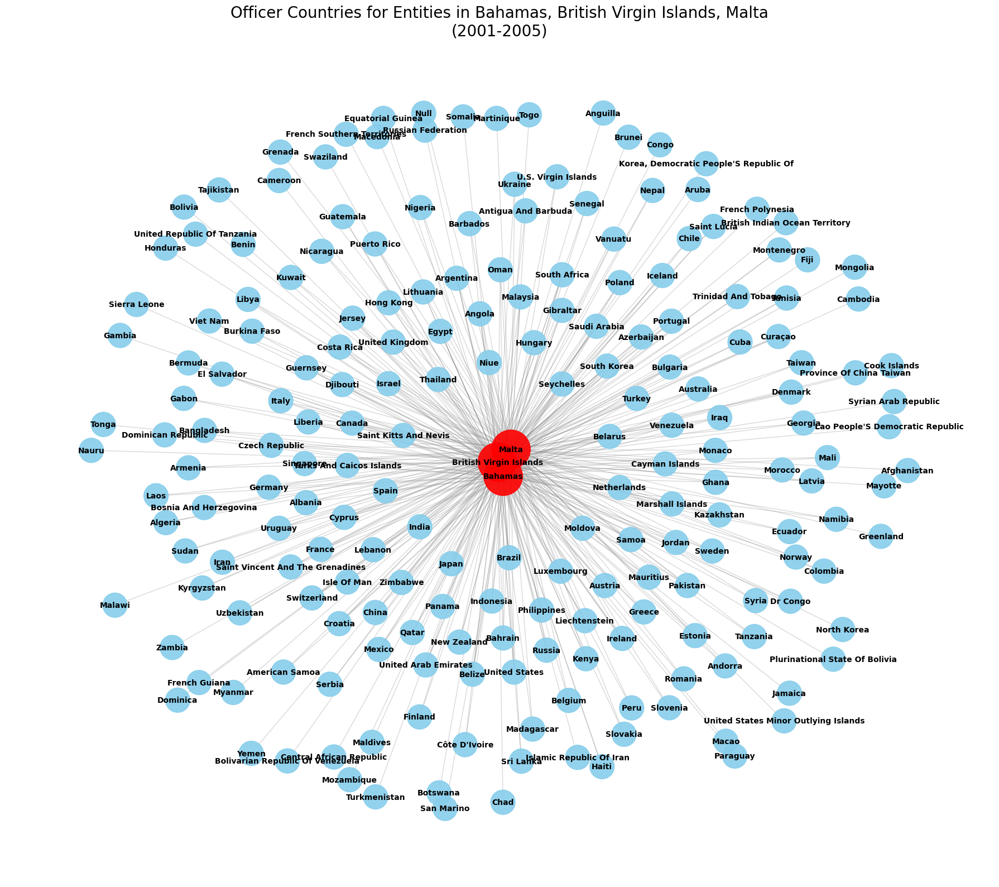

Post-sanction (2001-2005) combined graph for Bahamas, British Virgin Islands, Malta: 206 nodes, 430 edges.


In [43]:
import networkx as nx
import pandas as pd

import matplotlib.pyplot as plt

# Target jurisdictions for the combined graphs
target_jurisdictions_list = ["Bahamas", "British Virgin Islands", "Malta"]

# --- Helper function to build the combined network ---
# Assumes get_clean_officer_countries is available from a previous cell.
# Assumes officer_rels_processed is available and processed from previous cells.
# df_entities_in_period_and_targets should be pre-filtered for the relevant time period
# and for entities whose jurisdiction_description_end is in target_jurisdictions_list.
def build_combined_officer_network(df_entities_in_period_and_targets, list_of_jurisdictions):
    G = nx.Graph()
    
    # Add main jurisdiction nodes
    for jur_name in list_of_jurisdictions:
        G.add_node(jur_name)
        
    for _, row in df_entities_in_period_and_targets.iterrows():
        entity_jurisdiction = row['jurisdiction_description_end']
        
        # This check is an additional safeguard; the input DataFrame should already be filtered.
        if entity_jurisdiction not in list_of_jurisdictions:
            continue

        officer_countries_set = get_clean_officer_countries(row['countries_start']) # Expects set of lowercased strings
        
        for officer_country_lower in officer_countries_set:
            if not officer_country_lower: # Skip if empty
                continue
            
            officer_node_name_display = officer_country_lower.title() # e.g., "Usa"
            
            # Skip if the officer's country is one of the target jurisdictions themselves.
            # We want to see connections from *external* countries to this group.
            if officer_node_name_display in list_of_jurisdictions:
                continue
            
            # Add officer country node if it doesn't exist
            if not G.has_node(officer_node_name_display):
                G.add_node(officer_node_name_display)
            
            # Add edge between the external officer country and the entity's jurisdiction
            G.add_edge(officer_node_name_display, entity_jurisdiction)
            
    return G

# --- Helper function to plot the combined network ---
def plot_combined_officer_network(G, title_str, list_of_jurisdictions):
    plt.figure(figsize=(18, 16)) 
    if not G.nodes() or not G.edges(): # Check for edges too, as nodes might exist with no connections
        plt.title(f"{title_str} (No data or connections to display)")
        plt.axis('off')
        plt.show()
        return
        
    pos = nx.spring_layout(G, k=0.8, iterations=70, seed=42) 
    
    node_colors = []
    node_sizes = []
    labels = {} # For explicit label control
    
    for node in G.nodes():
        labels[node] = node # Default label is the node name
        if node in list_of_jurisdictions:
            node_colors.append('red')
            node_sizes.append(2500) 
        else: # Officer countries
            node_colors.append('skyblue')
            node_sizes.append(1000)
            
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9)
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.3, edge_color='gray')
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=10, font_weight='bold')
    
    plt.title(title_str, fontsize=20)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# --- Main processing ---

# Filter officer_rels_processed for entities within the target jurisdictions
df_relevant_jurisdictions = officer_rels_processed[
    officer_rels_processed['jurisdiction_description_end'].isin(target_jurisdictions_list)
].copy()

# Pre-sanction period data (1995-1999)
df_combined_pre = df_relevant_jurisdictions[
    (df_relevant_jurisdictions['inc_year'] >= pre_start_year) &
    (df_relevant_jurisdictions['inc_year'] <= pre_end_year)
]

# Post-sanction period data (2001-2005)
df_combined_post = df_relevant_jurisdictions[
    (df_relevant_jurisdictions['inc_year'] >= post_start_year) &
    (df_relevant_jurisdictions['inc_year'] <= post_end_year)
]

# Build and plot pre-sanction combined network
G_pre_combined = build_combined_officer_network(df_combined_pre, target_jurisdictions_list)
plot_combined_officer_network(G_pre_combined, 
                              f"Officer Countries for Entities in {', '.join(target_jurisdictions_list)}\n({pre_start_year}-{pre_end_year})", 
                              target_jurisdictions_list)
print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) combined graph for {', '.join(target_jurisdictions_list)}: {len(G_pre_combined.nodes())} nodes, {len(G_pre_combined.edges())} edges.")
if df_combined_pre.empty:
    print(f"No officer relationships found for {', '.join(target_jurisdictions_list)} in the pre-sanction period.")


# Build and plot post-sanction combined network
G_post_combined = build_combined_officer_network(df_combined_post, target_jurisdictions_list)
plot_combined_officer_network(G_post_combined, 
                               f"Officer Countries for Entities in {', '.join(target_jurisdictions_list)}\n({post_start_year}-{post_end_year})", 
                               target_jurisdictions_list)
print(f"Post-sanction ({post_start_year}-{post_end_year}) combined graph for {', '.join(target_jurisdictions_list)}: {len(G_post_combined.nodes())} nodes, {len(G_post_combined.edges())} edges.")
if df_combined_post.empty:
    print(f"No officer relationships found for {', '.join(target_jurisdictions_list)} in the post-sanction period.")


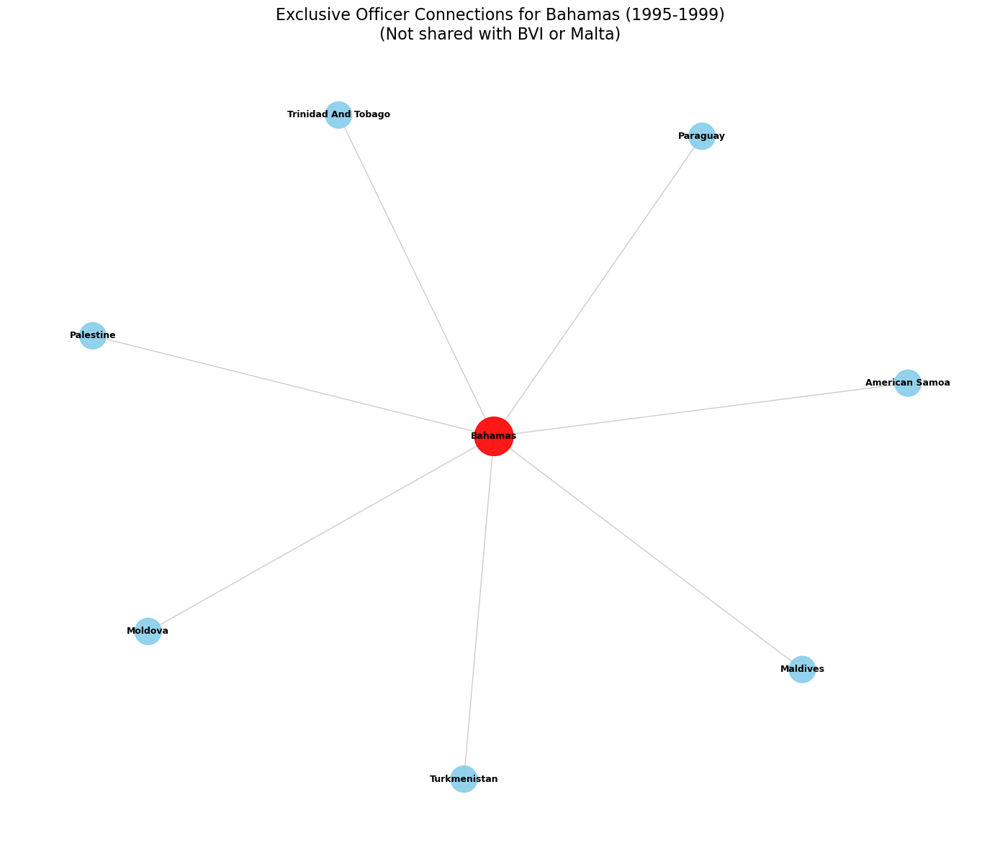

Pre-sanction (1995-1999) exclusive Bahamas graph: 8 nodes, 7 edges.


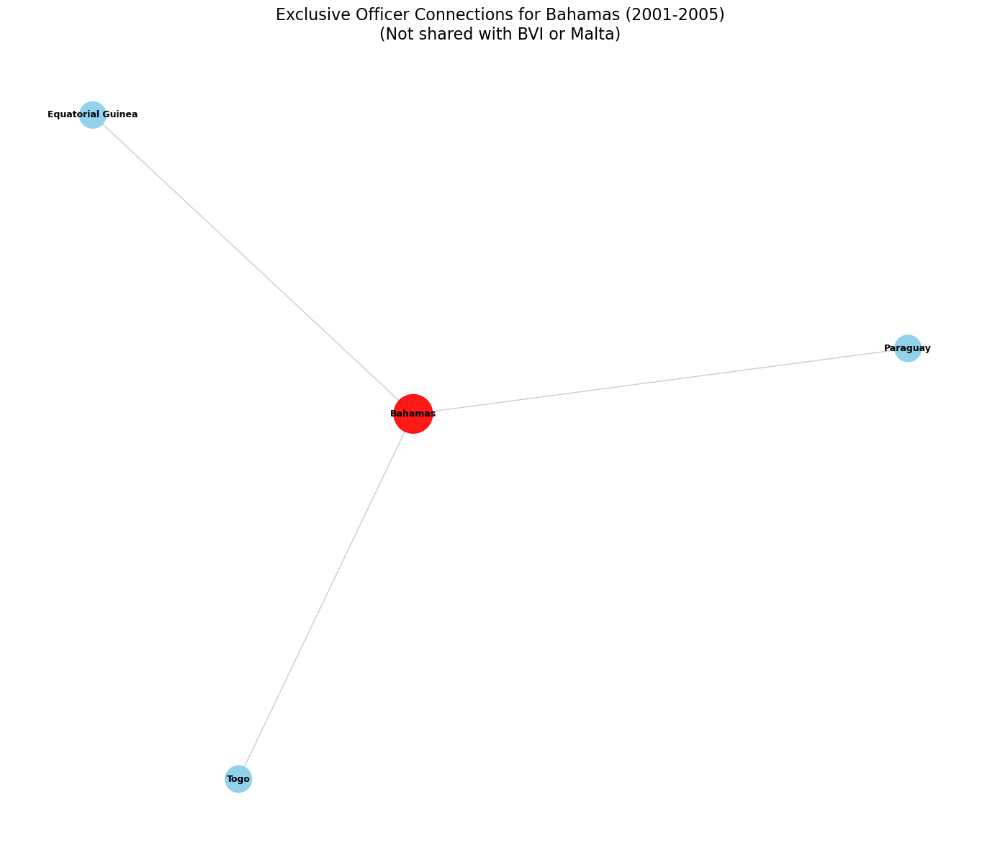

Post-sanction (2001-2005) exclusive Bahamas graph: 4 nodes, 3 edges.


In [44]:
import networkx as nx
import pandas as pd

import matplotlib.pyplot as plt

# Define target jurisdictions
target_jurisdiction_bahamas = "Bahamas"
jurisdiction_bvi = "British Virgin Islands"
jurisdiction_malta = "Malta"

# Ensure officer_rels_processed is available and correctly formatted
if 'officer_rels_processed' not in globals() or not isinstance(officer_rels_processed, pd.DataFrame):
    print("Error: 'officer_rels_processed' DataFrame not found. Please ensure previous cells (e.g., CELL 21-24) have been run.")
    # As a fallback, try to re-initialize if 'officer_rels' exists, similar to CELL 22/23
    if 'officer_rels' in globals() and isinstance(officer_rels, pd.DataFrame):
        print("Attempting to re-initialize 'officer_rels_processed' from 'officer_rels'.")
        officer_rels_processed = officer_rels.copy()
        if 'incorporation_date_end' not in officer_rels_processed.columns or officer_rels_processed['incorporation_date_end'].dtype != 'datetime64[ns]':
            officer_rels_processed['incorporation_date_end'] = pd.to_datetime(officer_rels_processed['incorporation_date_end'], errors='coerce')
        if 'inc_year' not in officer_rels_processed.columns:
            officer_rels_processed['inc_year'] = officer_rels_processed['incorporation_date_end'].dt.year
        officer_rels_processed.dropna(subset=['inc_year'], inplace=True)
        officer_rels_processed['inc_year'] = officer_rels_processed['inc_year'].astype(int)
    else:
        raise NameError("Critical DataFrame 'officer_rels_processed' or 'officer_rels' is missing.")

# Time periods (should be defined in previous cells, e.g. CELL 21-24)
# pre_start_year = 1995
# pre_end_year = 1999
# post_start_year = 2001
# post_end_year = 2005

# Helper function to get all unique officer countries for a given jurisdiction and period
# Assumes get_clean_officer_countries is defined in a previous cell
def get_all_officer_countries_for_jurisdiction_period(df, jur_name, start_year, end_year):
    period_df = df[
        (df['jurisdiction_description_end'] == jur_name) &
        (df['inc_year'] >= start_year) &
        (df['inc_year'] <= end_year)
    ]
    all_countries = set()
    for _, row in period_df.iterrows():
        all_countries.update(get_clean_officer_countries(row['countries_start']))
    return all_countries

# Calculate officer countries connected to BVI and Malta for exclusion
# Pre-sanction period
officer_countries_bvi_pre = get_all_officer_countries_for_jurisdiction_period(officer_rels_processed, jurisdiction_bvi, pre_start_year, pre_end_year)
officer_countries_malta_pre = get_all_officer_countries_for_jurisdiction_period(officer_rels_processed, jurisdiction_malta, pre_start_year, pre_end_year)
exclude_countries_pre = officer_countries_bvi_pre.union(officer_countries_malta_pre)

# Post-sanction period
officer_countries_bvi_post = get_all_officer_countries_for_jurisdiction_period(officer_rels_processed, jurisdiction_bvi, post_start_year, post_end_year)
officer_countries_malta_post = get_all_officer_countries_for_jurisdiction_period(officer_rels_processed, jurisdiction_malta, post_start_year, post_end_year)
exclude_countries_post = officer_countries_bvi_post.union(officer_countries_malta_post)

# Filter Bahamas data for the defined periods
bahamas_rels_all = officer_rels_processed[officer_rels_processed['jurisdiction_description_end'] == target_jurisdiction_bahamas].copy()

df_bahamas_pre_period = bahamas_rels_all[
    (bahamas_rels_all['inc_year'] >= pre_start_year) &
    (bahamas_rels_all['inc_year'] <= pre_end_year)
]
df_bahamas_post_period = bahamas_rels_all[
    (bahamas_rels_all['inc_year'] >= post_start_year) &
    (bahamas_rels_all['inc_year'] <= post_end_year)
]

# Function to build the Bahamas network, excluding specified officer countries
def build_exclusive_bahamas_network(df_bahamas_period_data, bahamas_name, countries_to_exclude):
    G = nx.Graph()
    bahamas_name_lower = bahamas_name.lower()
    
    if not df_bahamas_period_data.empty:
        G.add_node(bahamas_name) 
        
        for _, row in df_bahamas_period_data.iterrows():
            officer_countries = get_clean_officer_countries(row['countries_start']) # set of lowercased strings
            for country_lower in officer_countries:
                # Include if not empty, not Bahamas itself, and not in the exclusion set
                if country_lower and country_lower != bahamas_name_lower and country_lower not in countries_to_exclude:
                    officer_node_name_display = country_lower.title()
                    G.add_node(officer_node_name_display)
                    G.add_edge(officer_node_name_display, bahamas_name)
    return G

# Build and plot the pre-sanction exclusive network for Bahamas
G_bahamas_pre_exclusive = build_exclusive_bahamas_network(df_bahamas_pre_period, target_jurisdiction_bahamas, exclude_countries_pre)
plot_officer_network(G_bahamas_pre_exclusive,
                     f"Exclusive Officer Connections for {target_jurisdiction_bahamas} ({pre_start_year}-{pre_end_year})\n(Not shared with BVI or Malta)",
                     target_jurisdiction_bahamas)
print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) exclusive Bahamas graph: {len(G_bahamas_pre_exclusive.nodes())} nodes, {len(G_bahamas_pre_exclusive.edges())} edges.")
if df_bahamas_pre_period.empty:
    print(f"No officer relationships found for {target_jurisdiction_bahamas} in the pre-sanction period.")


# Build and plot the post-sanction exclusive network for Bahamas
G_bahamas_post_exclusive = build_exclusive_bahamas_network(df_bahamas_post_period, target_jurisdiction_bahamas, exclude_countries_post)
plot_officer_network(G_bahamas_post_exclusive,
                     f"Exclusive Officer Connections for {target_jurisdiction_bahamas} ({post_start_year}-{post_end_year})\n(Not shared with BVI or Malta)",
                     target_jurisdiction_bahamas)
print(f"Post-sanction ({post_start_year}-{post_end_year}) exclusive Bahamas graph: {len(G_bahamas_post_exclusive.nodes())} nodes, {len(G_bahamas_post_exclusive.edges())} edges.")
if df_bahamas_post_period.empty:
    print(f"No officer relationships found for {target_jurisdiction_bahamas} in the post-sanction period.")


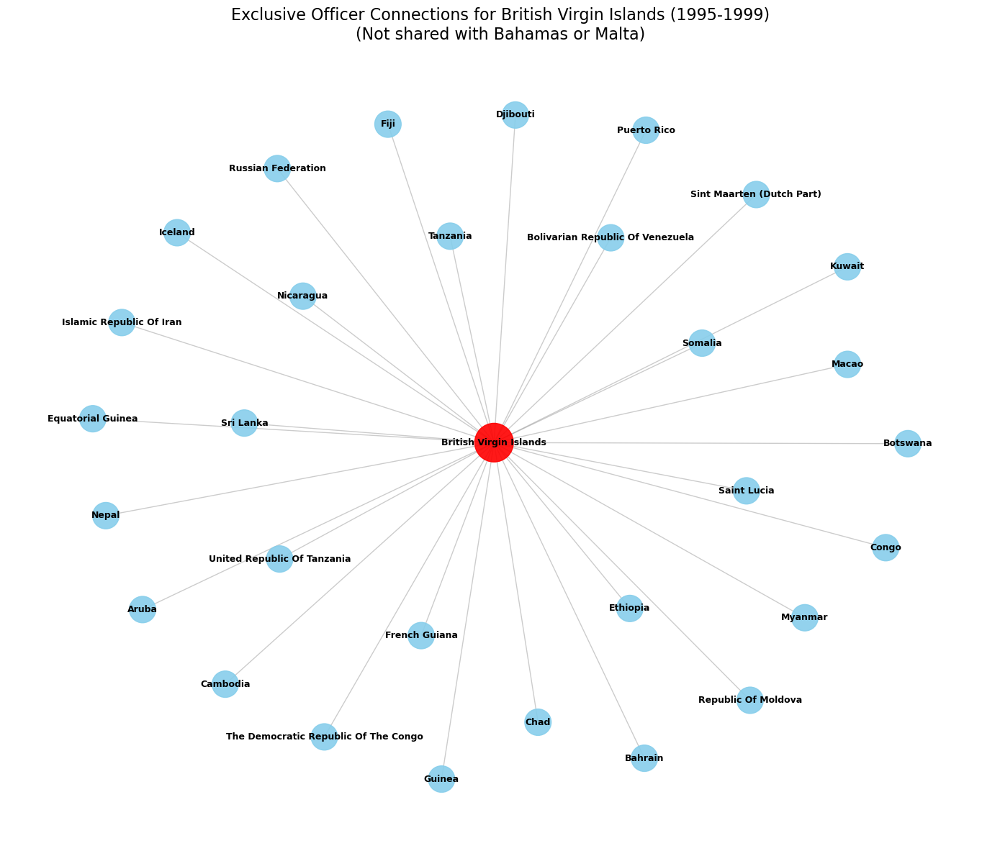

Pre-sanction (1995-1999) BVI data rows: 50317
Pre-sanction (1995-1999) exclusive BVI graph: 31 nodes, 30 edges.


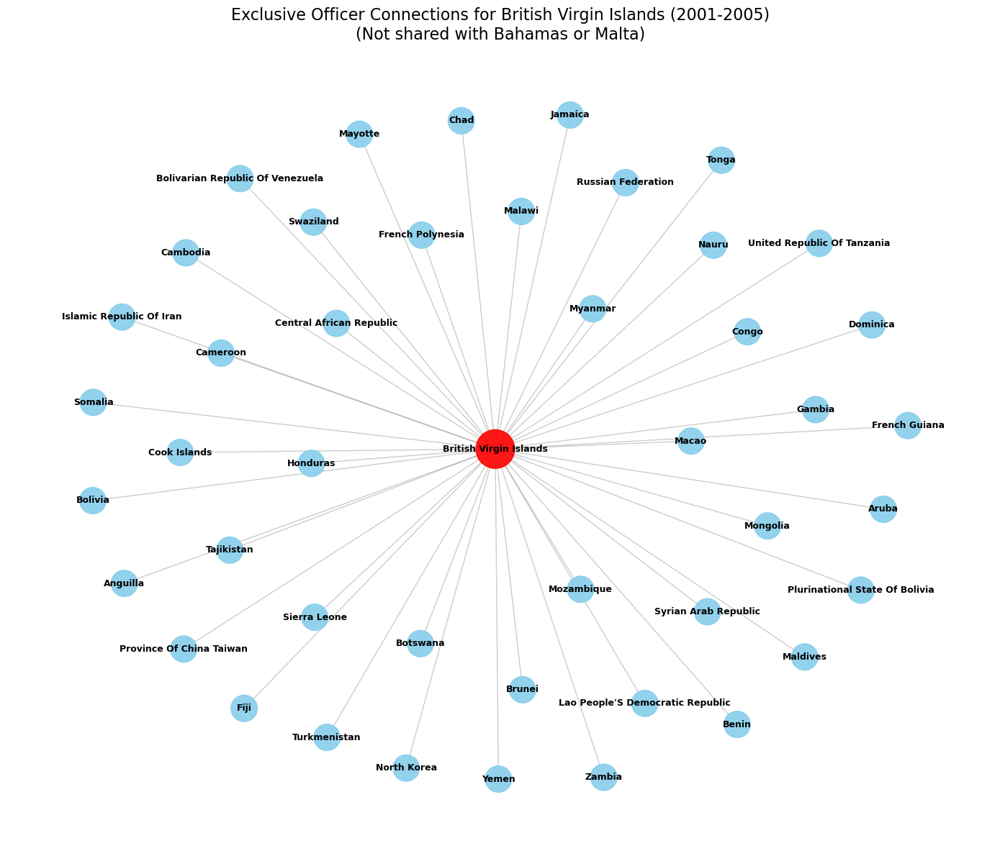

Post-sanction (2001-2005) BVI data rows: 104800
Post-sanction (2001-2005) exclusive BVI graph: 45 nodes, 44 edges.


In [45]:
import networkx as nx
import pandas as pd

import matplotlib.pyplot as plt

# Define target and exclusion jurisdictions
target_jurisdiction_bvi_exclusive = "British Virgin Islands"
exclude_jurisdiction_bah = "Bahamas"
exclude_jurisdiction_mlt = "Malta"

# Ensure officer_rels_processed is available and correctly formatted
# This check is similar to those in CELL 22, 23, 25
if 'officer_rels_processed' not in globals() or not isinstance(officer_rels_processed, pd.DataFrame):
    print("Error: 'officer_rels_processed' DataFrame not found. Please ensure previous cells have been run.")
    if 'officer_rels' in globals() and isinstance(officer_rels, pd.DataFrame):
        print("Attempting to re-initialize 'officer_rels_processed' from 'officer_rels'.")
        officer_rels_processed = officer_rels.copy()
        if 'incorporation_date_end' not in officer_rels_processed.columns or officer_rels_processed['incorporation_date_end'].dtype != 'datetime64[ns]':
            officer_rels_processed['incorporation_date_end'] = pd.to_datetime(officer_rels_processed['incorporation_date_end'], errors='coerce')
        if 'inc_year' not in officer_rels_processed.columns:
            officer_rels_processed['inc_year'] = officer_rels_processed['incorporation_date_end'].dt.year
        officer_rels_processed.dropna(subset=['inc_year'], inplace=True)
        officer_rels_processed['inc_year'] = officer_rels_processed['inc_year'].astype(int)
    else:
        raise NameError("Critical DataFrame 'officer_rels_processed' or 'officer_rels' is missing.")

# Time periods (should be defined in previous cells, e.g. CELL 21-25: 1995-1999 and 2001-2005)
# pre_start_year, pre_end_year, post_start_year, post_end_year are assumed to be globally available.
# If not, uncomment and set them:
# pre_start_year = 1995
# pre_end_year = 1999
# post_start_year = 2001
# post_end_year = 2005


# Helper function to get all unique officer countries for a given jurisdiction and period
# Assumes get_clean_officer_countries is defined in a previous cell (e.g. CELL 21, 23, 24, 25)
# Assumes get_all_officer_countries_for_jurisdiction_period is defined in a previous cell (e.g. CELL 25)
if 'get_all_officer_countries_for_jurisdiction_period' not in globals():
    def get_all_officer_countries_for_jurisdiction_period(df, jur_name, start_year, end_year):
        period_df = df[
            (df['jurisdiction_description_end'] == jur_name) &
            (df['inc_year'] >= start_year) &
            (df['inc_year'] <= end_year)
        ]
        all_countries = set()
        for _, row in period_df.iterrows():
            # Ensure get_clean_officer_countries is available
            if 'get_clean_officer_countries' in globals():
                 all_countries.update(get_clean_officer_countries(row['countries_start']))
            else:
                # Fallback or raise error if get_clean_officer_countries is missing
                # For simplicity, this example assumes it's available.
                # A more robust solution would check and define it if missing.
                print("Warning: get_clean_officer_countries function not found.")
                # Basic split as a fallback (less robust than the original)
                if pd.notna(row['countries_start']):
                    all_countries.update(c.strip().lower() for c in str(row['countries_start']).split(';') if c.strip())
        return all_countries

# Calculate officer countries connected to Bahamas and Malta for exclusion
# Pre-sanction period
officer_countries_bah_pre = get_all_officer_countries_for_jurisdiction_period(officer_rels_processed, exclude_jurisdiction_bah, pre_start_year, pre_end_year)
officer_countries_mlt_pre = get_all_officer_countries_for_jurisdiction_period(officer_rels_processed, exclude_jurisdiction_mlt, pre_start_year, pre_end_year)
exclude_countries_for_bvi_pre = officer_countries_bah_pre.union(officer_countries_mlt_pre)

# Post-sanction period
officer_countries_bah_post = get_all_officer_countries_for_jurisdiction_period(officer_rels_processed, exclude_jurisdiction_bah, post_start_year, post_end_year)
officer_countries_mlt_post = get_all_officer_countries_for_jurisdiction_period(officer_rels_processed, exclude_jurisdiction_mlt, post_start_year, post_end_year)
exclude_countries_for_bvi_post = officer_countries_bah_post.union(officer_countries_mlt_post)

# Filter BVI data for the defined periods
bvi_rels_all_exclusive = officer_rels_processed[officer_rels_processed['jurisdiction_description_end'] == target_jurisdiction_bvi_exclusive].copy()

df_bvi_pre_exclusive_period = bvi_rels_all_exclusive[
    (bvi_rels_all_exclusive['inc_year'] >= pre_start_year) &
    (bvi_rels_all_exclusive['inc_year'] <= pre_end_year)
]
df_bvi_post_exclusive_period = bvi_rels_all_exclusive[
    (bvi_rels_all_exclusive['inc_year'] >= post_start_year) &
    (bvi_rels_all_exclusive['inc_year'] <= post_end_year)
]

# Function to build the BVI network, excluding specified officer countries
# This is a generic version of the function from CELL 25
def build_exclusive_network(df_target_jur_period_data, target_jur_name, countries_to_exclude_set):
    G = nx.Graph()
    target_jur_name_lower = target_jur_name.lower()
    
    if not df_target_jur_period_data.empty:
        G.add_node(target_jur_name) 
        
        for _, row in df_target_jur_period_data.iterrows():
            # Ensure get_clean_officer_countries is available
            if 'get_clean_officer_countries' not in globals():
                print("Error: get_clean_officer_countries function is required but not found.")
                return G # Return empty or partially built graph

            officer_countries = get_clean_officer_countries(row['countries_start']) # set of lowercased strings
            for country_lower in officer_countries:
                # Include if not empty, not the target jurisdiction itself, and not in the exclusion set
                if country_lower and country_lower != target_jur_name_lower and country_lower not in countries_to_exclude_set:
                    officer_node_name_display = country_lower.title()
                    G.add_node(officer_node_name_display)
                    G.add_edge(officer_node_name_display, target_jur_name)
    return G

# Ensure plot_officer_network is available (from CELL 21, 23, 25)
if 'plot_officer_network' not in globals():
    print("Warning: plot_officer_network function not found. Defining a basic version.")
    def plot_officer_network(G, title_str, target_node_name):
        plt.figure(figsize=(14, 12))
        if not G.nodes():
            plt.title(f"{title_str} (No data to display)")
            plt.axis('off')
            plt.show()
            return
        pos = nx.spring_layout(G, k=0.6, iterations=50, seed=42)
        node_colors = ['red' if node == target_node_name else 'skyblue' for node in G.nodes()]
        node_sizes = [1500 if node == target_node_name else 700 for node in G.nodes()]
        nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9)
        nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.4, edge_color='gray')
        nx.draw_networkx_labels(G, pos, font_size=9, font_weight='bold')
        plt.title(title_str, fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.show()

# Build and plot the pre-sanction exclusive network for BVI
G_bvi_pre_exclusive_plot = build_exclusive_network(df_bvi_pre_exclusive_period, target_jurisdiction_bvi_exclusive, exclude_countries_for_bvi_pre)
plot_officer_network(G_bvi_pre_exclusive_plot,
                     f"Exclusive Officer Connections for {target_jurisdiction_bvi_exclusive} ({pre_start_year}-{pre_end_year})\n(Not shared with {exclude_jurisdiction_bah} or {exclude_jurisdiction_mlt})",
                     target_jurisdiction_bvi_exclusive)
print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) BVI data rows: {df_bvi_pre_exclusive_period.shape[0]}")
print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) exclusive BVI graph: {len(G_bvi_pre_exclusive_plot.nodes())} nodes, {len(G_bvi_pre_exclusive_plot.edges())} edges.")


# Build and plot the post-sanction exclusive network for BVI
G_bvi_post_exclusive_plot = build_exclusive_network(df_bvi_post_exclusive_period, target_jurisdiction_bvi_exclusive, exclude_countries_for_bvi_post)
plot_officer_network(G_bvi_post_exclusive_plot,
                     f"Exclusive Officer Connections for {target_jurisdiction_bvi_exclusive} ({post_start_year}-{post_end_year})\n(Not shared with {exclude_jurisdiction_bah} or {exclude_jurisdiction_mlt})",
                     target_jurisdiction_bvi_exclusive)
print(f"Post-sanction ({post_start_year}-{post_end_year}) BVI data rows: {df_bvi_post_exclusive_period.shape[0]}")
print(f"Post-sanction ({post_start_year}-{post_end_year}) exclusive BVI graph: {len(G_bvi_post_exclusive_plot.nodes())} nodes, {len(G_bvi_post_exclusive_plot.edges())} edges.")


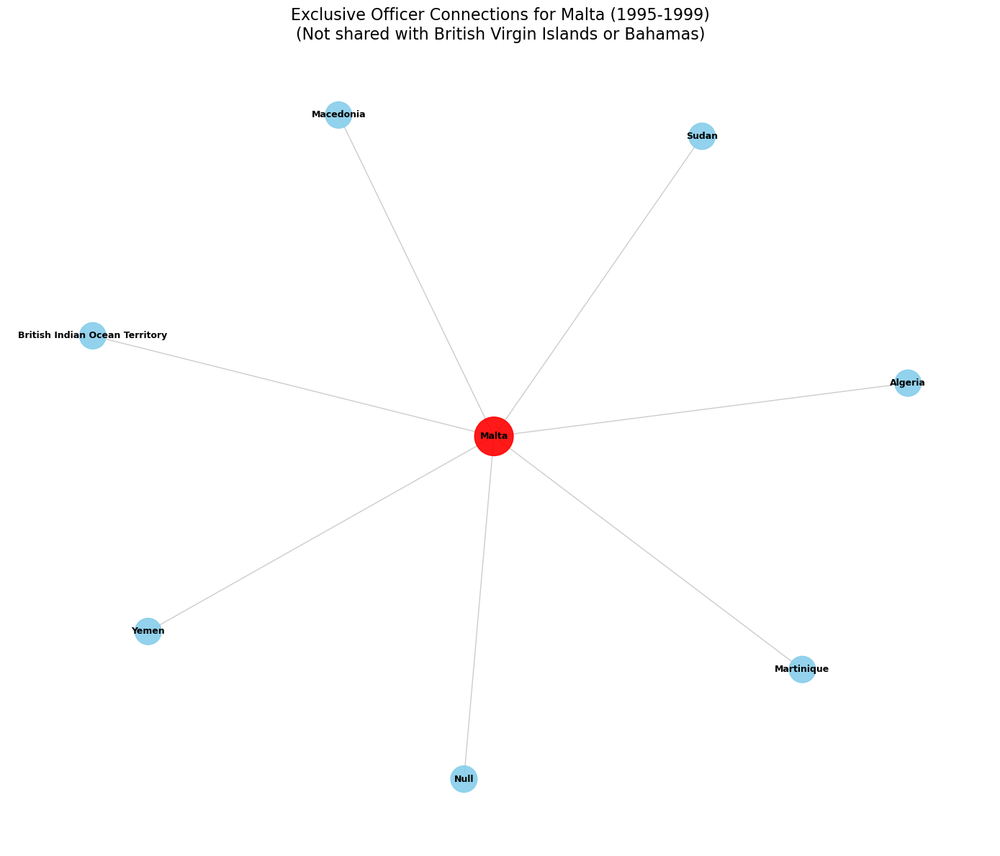

Pre-sanction (1995-1999) Malta data rows for exclusive graph: 50747
Pre-sanction (1995-1999) exclusive Malta graph: 8 nodes, 7 edges.


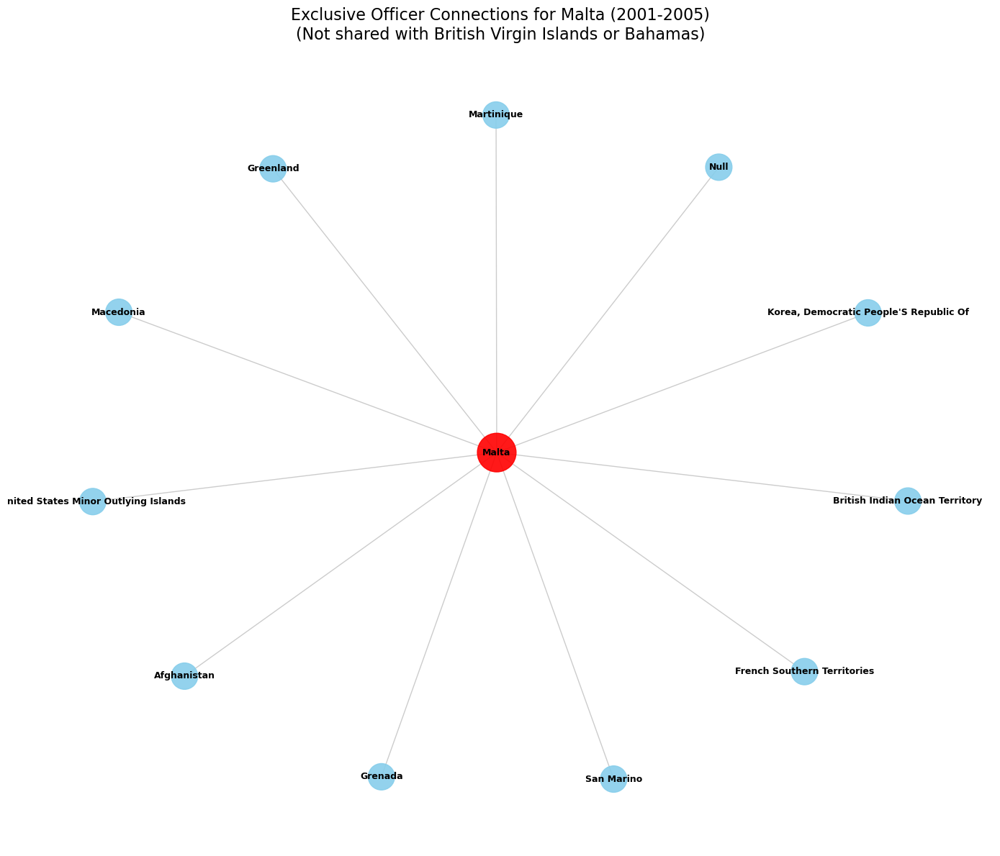

Post-sanction (2001-2005) Malta data rows for exclusive graph: 74878
Post-sanction (2001-2005) exclusive Malta graph: 12 nodes, 11 edges.


In [46]:
import networkx as nx
import pandas as pd

import matplotlib.pyplot as plt

# Define target and exclusion jurisdictions
target_jurisdiction_malta_exclusive = "Malta"
exclude_jurisdiction_bvi_for_malta = "British Virgin Islands"
exclude_jurisdiction_bah_for_malta = "Bahamas"

# Ensure officer_rels_processed is available and correctly formatted
# This check is similar to those in CELL 22, 23, 25, 26
if 'officer_rels_processed' not in globals() or not isinstance(officer_rels_processed, pd.DataFrame):
    print("Error: 'officer_rels_processed' DataFrame not found. Please ensure previous cells have been run.")
    if 'officer_rels' in globals() and isinstance(officer_rels, pd.DataFrame):
        print("Attempting to re-initialize 'officer_rels_processed' from 'officer_rels'.")
        officer_rels_processed = officer_rels.copy()
        if 'incorporation_date_end' not in officer_rels_processed.columns or officer_rels_processed['incorporation_date_end'].dtype != 'datetime64[ns]':
            officer_rels_processed['incorporation_date_end'] = pd.to_datetime(officer_rels_processed['incorporation_date_end'], errors='coerce')
        if 'inc_year' not in officer_rels_processed.columns:
            officer_rels_processed['inc_year'] = officer_rels_processed['incorporation_date_end'].dt.year
        officer_rels_processed.dropna(subset=['inc_year'], inplace=True)
        officer_rels_processed['inc_year'] = officer_rels_processed['inc_year'].astype(int)
    else:
        raise NameError("Critical DataFrame 'officer_rels_processed' or 'officer_rels' is missing.")

# Time periods (should be defined in previous cells, e.g. CELL 21-26: 1995-1999 and 2001-2005)
# pre_start_year, pre_end_year, post_start_year, post_end_year are assumed to be globally available.
# If not, define them:
# pre_start_year = 1995
# pre_end_year = 1999
# post_start_year = 2001
# post_end_year = 2005

# Ensure helper functions are available from previous cells.
# These include:
# - get_clean_officer_countries (e.g., from CELL 21, 23, 24, 25)
# - get_all_officer_countries_for_jurisdiction_period (e.g., from CELL 25, 26)
# - build_exclusive_network (e.g., from CELL 26)
# - plot_officer_network (e.g., from CELL 21, 23, 25, 26)
# If any are missing, they would need to be redefined here. For this solution, we assume they exist.

# --- Pre-sanction period (1995-1999) ---
# Calculate officer countries connected to BVI and Bahamas for exclusion in the pre-sanction period
officer_countries_bvi_pre_for_malta = get_all_officer_countries_for_jurisdiction_period(
    officer_rels_processed, exclude_jurisdiction_bvi_for_malta, pre_start_year, pre_end_year
)
officer_countries_bah_pre_for_malta = get_all_officer_countries_for_jurisdiction_period(
    officer_rels_processed, exclude_jurisdiction_bah_for_malta, pre_start_year, pre_end_year
)
exclude_countries_for_malta_pre = officer_countries_bvi_pre_for_malta.union(officer_countries_bah_pre_for_malta)

# Filter Malta data for the pre-sanction period
malta_rels_all_exclusive = officer_rels_processed[
    officer_rels_processed['jurisdiction_description_end'] == target_jurisdiction_malta_exclusive
].copy()

df_malta_pre_exclusive_period = malta_rels_all_exclusive[
    (malta_rels_all_exclusive['inc_year'] >= pre_start_year) &
    (malta_rels_all_exclusive['inc_year'] <= pre_end_year)
]

# Build and plot the pre-sanction exclusive network for Malta
G_malta_pre_exclusive_plot = build_exclusive_network(
    df_malta_pre_exclusive_period, target_jurisdiction_malta_exclusive, exclude_countries_for_malta_pre
)
plot_officer_network(
    G_malta_pre_exclusive_plot,
    f"Exclusive Officer Connections for {target_jurisdiction_malta_exclusive} ({pre_start_year}-{pre_end_year})\n(Not shared with {exclude_jurisdiction_bvi_for_malta} or {exclude_jurisdiction_bah_for_malta})",
    target_jurisdiction_malta_exclusive
)
print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) Malta data rows for exclusive graph: {df_malta_pre_exclusive_period.shape[0]}")
print(f"Pre-sanction ({pre_start_year}-{pre_end_year}) exclusive Malta graph: {len(G_malta_pre_exclusive_plot.nodes())} nodes, {len(G_malta_pre_exclusive_plot.edges())} edges.")
if df_malta_pre_exclusive_period.empty:
    print(f"No officer relationships found for {target_jurisdiction_malta_exclusive} in the pre-sanction period to build the graph.")


# --- Post-sanction period (2001-2005) ---
# Calculate officer countries connected to BVI and Bahamas for exclusion in the post-sanction period
officer_countries_bvi_post_for_malta = get_all_officer_countries_for_jurisdiction_period(
    officer_rels_processed, exclude_jurisdiction_bvi_for_malta, post_start_year, post_end_year
)
officer_countries_bah_post_for_malta = get_all_officer_countries_for_jurisdiction_period(
    officer_rels_processed, exclude_jurisdiction_bah_for_malta, post_start_year, post_end_year
)
exclude_countries_for_malta_post = officer_countries_bvi_post_for_malta.union(officer_countries_bah_post_for_malta)

# Filter Malta data for the post-sanction period
df_malta_post_exclusive_period = malta_rels_all_exclusive[
    (malta_rels_all_exclusive['inc_year'] >= post_start_year) &
    (malta_rels_all_exclusive['inc_year'] <= post_end_year)
]

# Build and plot the post-sanction exclusive network for Malta
G_malta_post_exclusive_plot = build_exclusive_network(
    df_malta_post_exclusive_period, target_jurisdiction_malta_exclusive, exclude_countries_for_malta_post
)
plot_officer_network(
    G_malta_post_exclusive_plot,
    f"Exclusive Officer Connections for {target_jurisdiction_malta_exclusive} ({post_start_year}-{post_end_year})\n(Not shared with {exclude_jurisdiction_bvi_for_malta} or {exclude_jurisdiction_bah_for_malta})",
    target_jurisdiction_malta_exclusive
)
print(f"Post-sanction ({post_start_year}-{post_end_year}) Malta data rows for exclusive graph: {df_malta_post_exclusive_period.shape[0]}")
print(f"Post-sanction ({post_start_year}-{post_end_year}) exclusive Malta graph: {len(G_malta_post_exclusive_plot.nodes())} nodes, {len(G_malta_post_exclusive_plot.edges())} edges.")
if df_malta_post_exclusive_period.empty:
    print(f"No officer relationships found for {target_jurisdiction_malta_exclusive} in the post-sanction period to build the graph.")
